Analysis performed by Olivia Debnath (Berlin Institute of Health & Charite)

- Supervisors: Dr. Naveed Ishaque & Prof.Dr. Roland Eils. 
    
The following notebook is a contribution towards the computational analysis of placenta/preeclampsia cell atlas (highlights placenta/villi) and the analyses also contribute to doctoral thesis. 

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
#Reload harmonized scVI data for placenta:
#results_scvi= "/data/analysis/preeclampsia_2019/placenta_atlas_2022/villi_scVI_harmonization/scvi_integration_1803/SP014_SP082_SP136_villi_scvi_lv15.h5ad"

results_scvi= "/dh-projects/preeclampsia_2022/analysis/placenta_atlas_2022/villi_scVI_harmonization/scvi_integration_1803/SP014_SP082_SP136_villi_scvi_lv15.h5ad"
adata_villi= sc.read_h5ad(results_scvi)

In [4]:
ldata_norm_int= adata_villi.raw.to_adata()

sc.pp.normalize_total(ldata_norm_int, target_sum=1e4)
sc.pp.log1p(ldata_norm_int) #take the logarithm

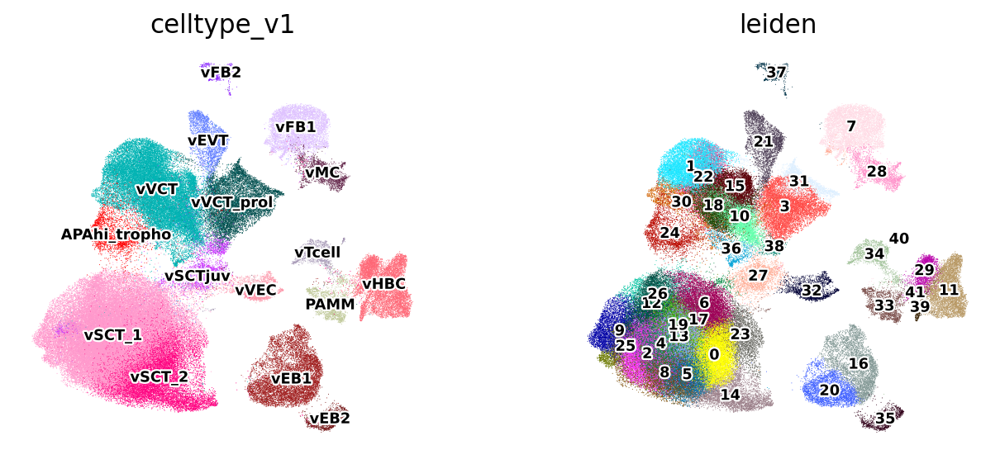

In [5]:
sc.set_figure_params(dpi=80, dpi_save=150)

#Before refining annotations:
sc.pl.umap(ldata_norm_int, color= ['celltype_v1', 'leiden'], legend_loc='on data',
           frameon=False, legend_fontsize=8, legend_fontoutline=2)

In [6]:
##Subset the trophoblast cell groups only: 'vSCT_1', 'vSCT_2', 'vSCTjuv', 'vVCT', 'vVCT_prol', 'vEVT', 'APAhi_tropho'
adata_tropho= adata_villi[adata_villi.obs['celltype_v1'].isin(['vSCT_1', 'vSCT_2', 'vSCTjuv', 'vVCT', 'vVCT_prol', 'vEVT', 'APAhi_tropho'])]

#Further subset the controls only (annotations of which were finalized for trajectory analysis)
adata_tropho= adata_tropho[adata_tropho.obs['disease']== 'C']
#adata_tropho.obs['leiden'].to_csv('Placenta_scvi_leiden_2403.csv') #Save the Leiden labels of trophoblast. 

#Leiden-38 (adata_villi) is mainly former control leiden-16.1 (clustering with vSCTjuv)
pd.crosstab(adata_tropho.obs['leiden'], adata_tropho.obs['vVCT_subclust'])

vVCT_subclust,APAhi_tropho,vEVT,vSCT_1,vSCT_2,vSCTjuv,vVCT,vVCT_prol
leiden,,,,,,,
0,0,4,1067,518,15,1,0
1,32,0,0,0,1,7691,56
2,0,0,4535,61,16,2,0
3,10,21,1,3,47,310,6834
4,8,2,4968,7,335,40,0
5,0,0,2601,767,13,2,0
6,2,1,1147,0,7,1,0
7,0,4,0,0,25,0,0
8,0,0,2226,422,3,0,0


In [7]:
pd.crosstab(adata_tropho[adata_tropho.obs['leiden']== '38'].obs['leiden'], 
            adata_tropho.obs['leiden_16'])

leiden_16,"Leiden_16,0","Leiden_16,1","Leiden_16,2",vEVT,vSCTjuv,vVCT,vVCT_prol
leiden,,,,,,,
38,4,413,4,1,6,13,122


In [8]:
#Extract the leiden-16.1:
#Steps below are done to refine the vSTBjuv & vCTBp clusters and prevent minor misclassifications. 
adata_leiden16= adata_tropho[adata_tropho.obs['leiden_16']== 'Leiden_16,1']
print(adata_leiden16.n_obs)  #547 cells in L16.1

#Refinement of vSTBjuv cluster: 
juv_leiden16= pd.Series(adata_leiden16.obs['leiden_16']) #Grab the barcodes of leiden 16.1 subcluster. 
adata_villi.obs["leiden_subclusters"]= adata_villi.obs["celltype_v1"] #create a copy. 
adata_villi.obs["leiden_subclusters"] = adata_villi.obs["leiden_subclusters"].astype(str)

#Replace the loci of cells to 36 & 38 leiden: 
adata_villi.obs["leiden_subclusters"].loc[juv_leiden16.index] = juv_leiden16 
adata_villi.obs["leiden_subclusters"].value_counts() 

547


/home/debnatho/anaconda3/envs/scvi_analysis/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


vSCT_1          59214
vVCT            26873
vSCT_2          13293
vVCT_prol        9502
vHBC             7588
vEB1             7464
vFB1             5742
vSCTjuv          2859
vEVT             2836
APAhi_tropho     2757
vMC              2142
vVEC             1974
PAMM             1969
vTcell           1480
vEB2             1036
vFB2              669
Leiden_16,1       547
Name: leiden_subclusters, dtype: int64

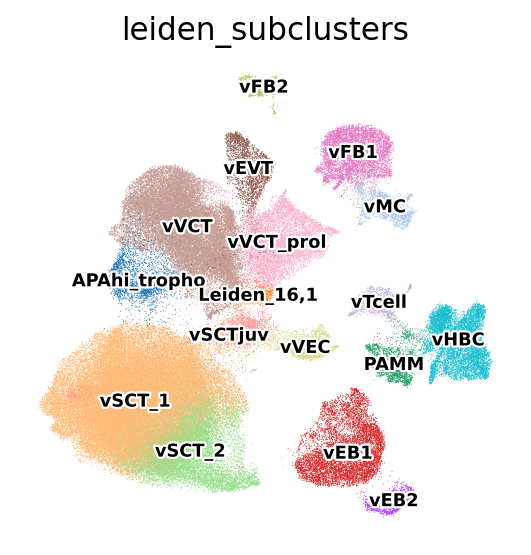

In [9]:
#Set the .obs back to category dtype: 
adata_villi.obs['leiden_subclusters']= adata_villi.obs['leiden_subclusters'].astype('category')

#Leiden-16.1 is an ambiguous cluster having mixed expression of vSTBjuv, vCTBprol & some vCCT features. 
sc.pl.umap(adata_villi, color= ['leiden_subclusters'], legend_loc='on data',
           frameon=False, legend_fontsize=8, legend_fontoutline=2) 

#Here, the Leiden-16.1 (anomalous cluster) can be spotted separately above vSTBjuv & in close contact with vCTB.

Trying to set attribute `._uns` of view, copying.


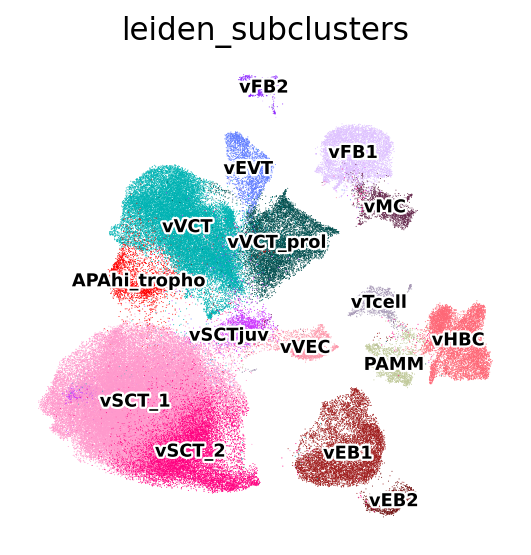

In [10]:
#Eliminate out 16.1 from the original anndata:
adata_filter= adata_villi[adata_villi.obs['leiden_subclusters']!= 'Leiden_16,1']

#Map back to original color codes:
adata_filter.uns['leiden_subclusters_colors']= adata_filter.uns['celltype_v1_colors'] #reassign colors

#UMAP after filtering L16.1 (perfect!): 
sc.pl.umap(adata_filter, color= ['leiden_subclusters'], legend_loc='on data',
           frameon=False, legend_fontsize=8, legend_fontoutline=2)

In [11]:
#Apparently, leiden-39 is proliferating HBC(s) marked by robust expression of TOP2A/MKI67:
#Interestingly, they are mainly found in first-trimester villi (435 early; 4 pre-term)
pd.crosstab(adata_filter[adata_filter.obs['leiden']== '39'].obs['leiden'],
           adata_filter.obs['time'])

time,early,late_preterm
leiden,,
39,435,4


In [12]:
#Create a copy of leiden_subclust:
adata_filter.obs.leiden_subclusters_refined= adata_filter.obs.leiden_subclusters

adata_hbc= adata_filter.copy()
adata_hbc= adata_hbc[adata_hbc.obs.leiden == '39'] 
print(adata_hbc.n_obs) 

#Rename the Leiden in HBC subset: 
adata_hbc.obs.leiden= (adata_hbc.obs.leiden.map(lambda x: {'39': 'vHBC_prol'}.get(x, x)).astype("category"))
adata_hbc.obs.leiden= adata_hbc.obs.leiden.astype('str')
hbc_prol= pd.Series(adata_hbc.obs.leiden)

#Add a refined variant of "leiden_subclusters" to store the additional vHBCp. 
adata_filter.obs['leiden_subclusters_refined']= adata_filter.obs['leiden_subclusters'] 
adata_filter.obs['leiden_subclusters_refined']= adata_filter.obs['leiden_subclusters_refined'].astype('string')

#Rename the existing leiden-39 cell barcodes as vHBC_prol:
adata_filter.obs['leiden_subclusters_refined'].loc[hbc_prol.index] = hbc_prol
adata_filter.obs['leiden_subclusters_refined'].value_counts() 

/home/debnatho/anaconda3/envs/scvi_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  
Trying to set attribute `.obs` of view, copying.


439


vSCT_1          59214
vVCT            26873
vSCT_2          13293
vVCT_prol        9501
vEB1             7460
vHBC             7154
vFB1             5742
vSCTjuv          2859
vEVT             2836
APAhi_tropho     2757
vMC              2142
vVEC             1974
PAMM             1969
vTcell           1480
vEB2             1036
vFB2              669
vHBC_prol         439
Name: leiden_subclusters_refined, dtype: Int64

In [13]:
adata_filter.obs['leiden_subclusters_refined']= adata_filter.obs['leiden_subclusters_refined'].astype('category')
adata_filter.obs['leiden_subclusters_refined'].cat.categories

Index(['APAhi_tropho', 'PAMM', 'vEB1', 'vEB2', 'vEVT', 'vFB1', 'vFB2', 'vHBC',
       'vHBC_prol', 'vMC', 'vSCT_1', 'vSCT_2', 'vSCTjuv', 'vTcell', 'vVCT',
       'vVCT_prol', 'vVEC'],
      dtype='object')

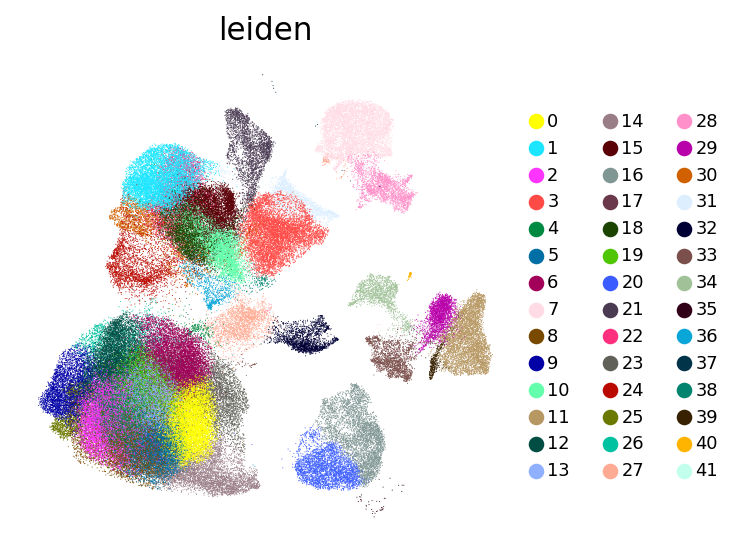

In [14]:
#Visualize the Leidens: 
sc.pl.umap(adata_filter[~adata_filter.obs['leiden_subclusters_refined'].isin(['vEB2', 'vFB2'])], 
           color= ['leiden'], 
           frameon=False, legend_fontsize=8)

In [15]:
#Remove the vFB2 & vEB2 as they map to specific donors:
adata_filter02= adata_filter[~adata_filter.obs['leiden_subclusters_refined'].isin(['vEB2', 'vFB2'])]

#Map the whole L28 as 'vMC': 
#The vSCT2 cells within L28 is a result of misclassifion. 
adata_filter02.obs.loc[(adata_filter02.obs.leiden == '28'), 'leiden_subclusters_refined'] = 'vMC'
adata_filter02.obs['leiden_subclusters_refined'].value_counts() 

vSCT_1          59211
vVCT            26873
vSCT_2          13265
vVCT_prol        9498
vEB1             7460
vHBC             7154
vFB1             5590
vSCTjuv          2840
vEVT             2834
APAhi_tropho     2757
vMC              2351
vVEC             1972
PAMM             1969
vTcell           1480
vHBC_prol         439
Name: leiden_subclusters_refined, dtype: int64

Trying to set attribute `._uns` of view, copying.


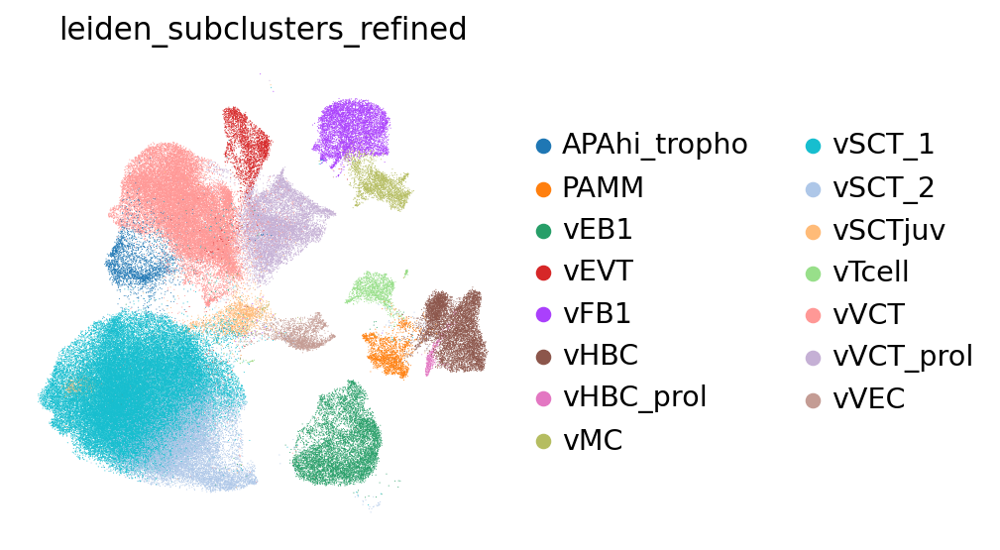

In [16]:
#Double check the vMC cluster:
sc.pl.umap(adata_filter02, 
           color= ['leiden_subclusters_refined'], 
           frameon=False) #semifinal 

In [17]:
adata_filter.uns['leiden_subclusters_refined_colors']= ['#ff0000', '#c0c999', '#9e1a1a', '#721313', '#5c7aff', '#dec1ff',
       '#8c29ff', '#fe6776', '#b32d00', '#63264a', '#ff99cc', '#ff0080', '#cc33ff',
       '#a799b7', '#00b3b3', '#004d4d', '#fd96A9']

adata_filter02= adata_filter[~adata_filter.obs['leiden_subclusters_refined'].isin(['vEB2', 'vFB2'])]

#Repeat the vMC step:
adata_filter02.obs.loc[(adata_filter02.obs.leiden == '28'), 'leiden_subclusters_refined'] = 'vMC'
adata_filter02.obs['leiden_subclusters_refined'].value_counts() 

vSCT_1          59211
vVCT            26873
vSCT_2          13265
vVCT_prol        9498
vEB1             7460
vHBC             7154
vFB1             5590
vSCTjuv          2840
vEVT             2834
APAhi_tropho     2757
vMC              2351
vVEC             1972
PAMM             1969
vTcell           1480
vHBC_prol         439
Name: leiden_subclusters_refined, dtype: int64

In [18]:
#Leiden-3 has 10 APAhi (aka vCTBpf) cells that should be VCTprol/VCT type: 
adata_filter02[adata_filter02.obs.leiden == '3'].obs['leiden_subclusters_refined'].value_counts()

vVCT_prol       6835
vVCT             317
vEVT              22
vSCTjuv           20
APAhi_tropho      10
vSCT_2             4
vEB1               2
vSCT_1             1
vMC                1
PAMM               1
Name: leiden_subclusters_refined, dtype: int64

In [20]:
adata_filter02.obs.leiden_subclusters_refined02= adata_filter02.obs.leiden_subclusters_refined

adata_filter02.obs.leiden_subclusters_refined02= adata_filter02.obs.leiden_subclusters_refined02.astype('object')

In [21]:
#Map the misclassified APAhi_tropho back to VCTprol cluster (or, vCTBp/aka leiden-3)
adata_filter02.obs.loc[(adata_filter02.obs.leiden == '3') & (adata_filter02.obs.leiden_subclusters_refined == 'APAhi_tropho'),
                       'leiden_subclusters_refined02'] = 'vVCT_prol'

adata_filter02[adata_filter02.obs.leiden == '3'].obs['leiden_subclusters_refined02'].value_counts() #renaming worked. 

vVCT_prol    6845
vVCT          317
vEVT           22
vSCTjuv        20
vSCT_2          4
vEB1            2
vSCT_1          1
PAMM            1
vMC             1
Name: leiden_subclusters_refined02, dtype: int64

In [22]:
#Apparently, leiden-40 is B-cell but just rarely found in three samples: 
pd.crosstab(adata_filter02[adata_filter02.obs['leiden']== '40'].obs['leiden'],
           adata_filter02.obs['donor_id'])

#Best: filter out L40 

donor_id,Donor-419-villi,SP136_022v,SP136_023v
leiden,,,
40,16,18,22


/home/debnatho/anaconda3/envs/scvi_analysis/lib/python3.7/site-packages/anndata/_core/anndata.py:1237: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_subclusters_refined02' as categorical


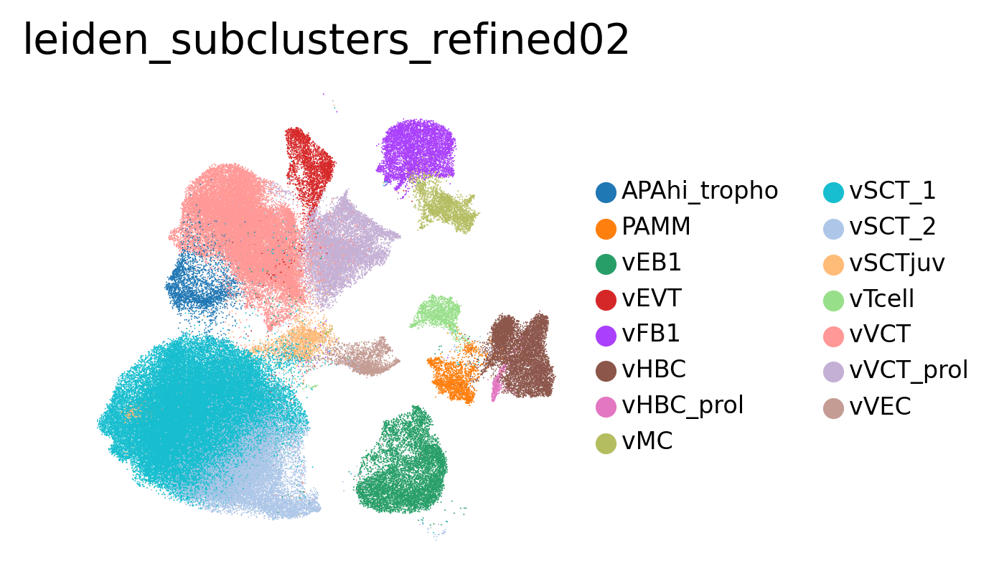

In [24]:
adata_filter02= adata_filter02[adata_filter02.obs['leiden']!= '40']
#adata_filter02.obs['leiden_subclusters_refined02'].value_counts()


#Set figure parameters: 
import matplotlib.pyplot as plt 
sc.settings.set_figure_params(dpi=150, dpi_save=180, vector_friendly=True, transparent=True)
plt.rcParams["figure.figsize"] = (3,3)

#Generate figures for the manuscript: redo after removing sparse B-cells. 
sc.pl.umap(adata_filter02, 
           color= ['leiden_subclusters_refined02'], 
           frameon=False, legend_fontsize=8) #save= '_placenta_atlas_umap_240322.pdf'

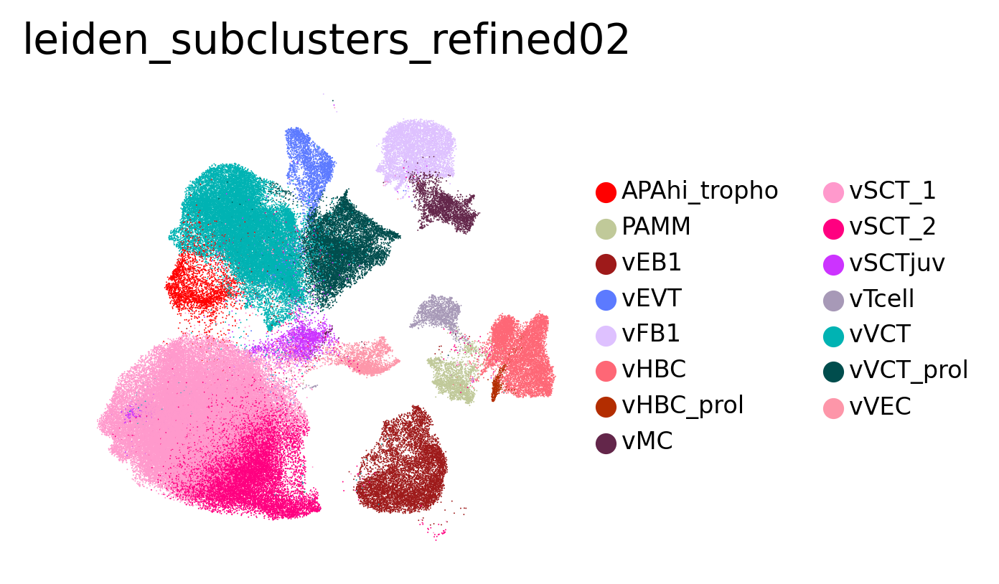

In [25]:
adata_filter02.uns['leiden_subclusters_refined02_colors']= adata_filter02.uns['leiden_subclusters_refined_colors']

sc.pl.umap(adata_filter02, 
           color= ['leiden_subclusters_refined02'], 
           frameon=False, legend_fontsize=8) #save= '_placenta_atlas_umap_240322.pdf'

In [26]:
adata_filter02.obs['celltype_v1_reordered']= adata_filter02.obs['leiden_subclusters_refined02'].cat.reorder_categories(['vVCT_prol', 'vVCT', 'APAhi_tropho',
    'vSCTjuv', 'vSCT_1', 'vSCT_2', 'vEVT', 'vFB1', 'vMC', 'vVEC', 'vHBC', 'vHBC_prol', 'PAMM', 'vTcell', 'vEB1'])

adata_filter02.obs['celltype_v1_reordered'].cat.categories

Index(['vVCT_prol', 'vVCT', 'APAhi_tropho', 'vSCTjuv', 'vSCT_1', 'vSCT_2',
       'vEVT', 'vFB1', 'vMC', 'vVEC', 'vHBC', 'vHBC_prol', 'PAMM', 'vTcell',
       'vEB1'],
      dtype='object')

In [27]:
#Rename the cell types/states according to the revised manuscript: 
adata_filter02.obs['celltype_v1_reordered']= adata_filter02.obs['leiden_subclusters_refined02'].map(lambda x: {"APAhi_tropho": "vCTBpf",
"vSCTjuv": "vSTBjuv", "vSCT_1": "vSTB1", "vSCT_2": "vSTB2", "vVCT_prol": "vCTBp", "vVCT": "vCTB",
"vEVT": "vCCT", "vFB1": "vFB", "vEB1": "vEB", "vHBC_prol": "vHBCp"}.get(x, x)).astype("category")

adata_filter02.obs['celltype_v1_reordered'].cat.categories

Index(['vCTBpf', 'PAMM', 'vEB', 'vCCT', 'vFB', 'vHBC', 'vHBCp', 'vMC', 'vSTB1',
       'vSTB2', 'vSTBjuv', 'vTcell', 'vCTB', 'vCTBp', 'vVEC'],
      dtype='object')

In [29]:
adata_filter02.uns['celltype_v1_reordered_colors']= adata_filter02.uns['leiden_subclusters_refined02_colors']

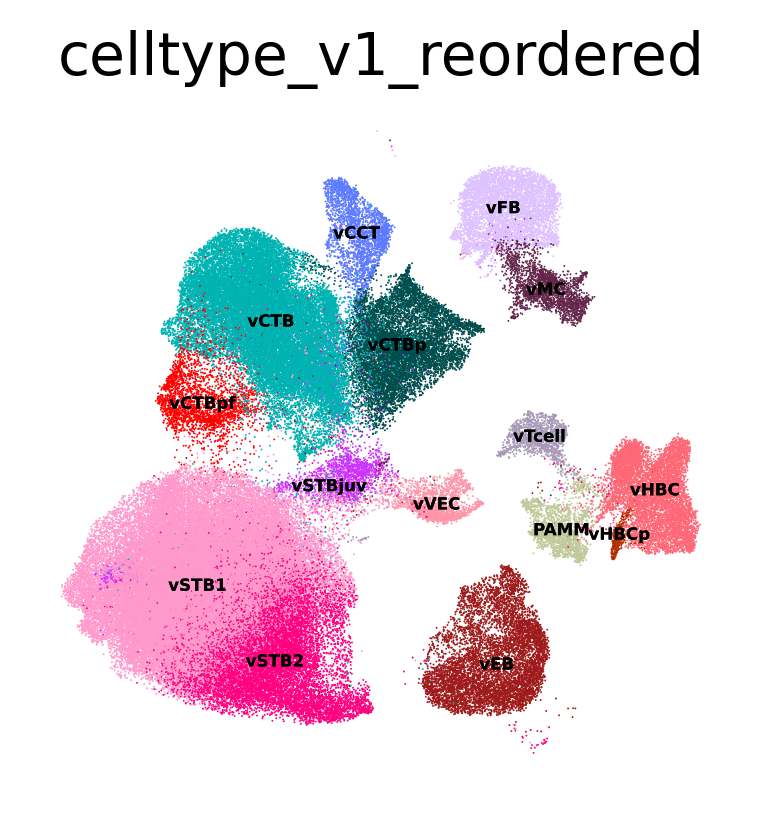

In [30]:
#Generate figures for the manuscript: figure 1B.  
#Label the clusters 
sc.pl.umap(adata_filter02, 
           color= ['celltype_v1_reordered'], legend_loc='on data',
           legend_fontoutline=0, 
           frameon=False, legend_fontsize=4)

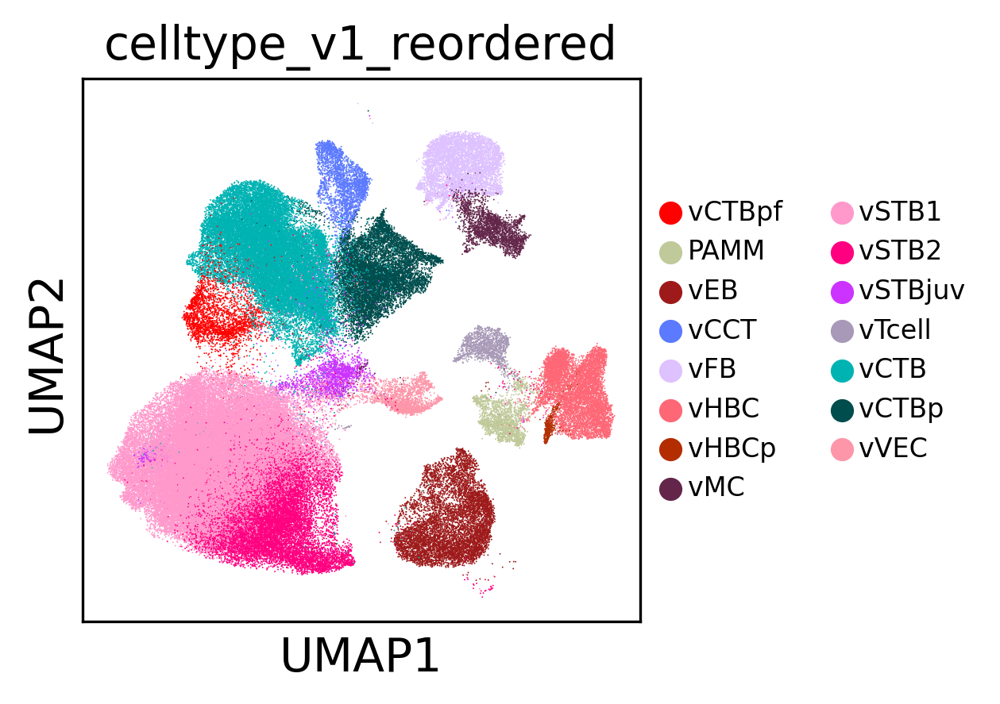

In [31]:
#Plot using axes: Figure1B (placenta)
#Separately batch-corrected (scVI), integrated & annotated (independently of decidua)
sc.pl.umap(adata_filter02, 
           color= ['celltype_v1_reordered'], 
           legend_fontoutline=0, legend_fontsize=8)

10X v2
10X v3


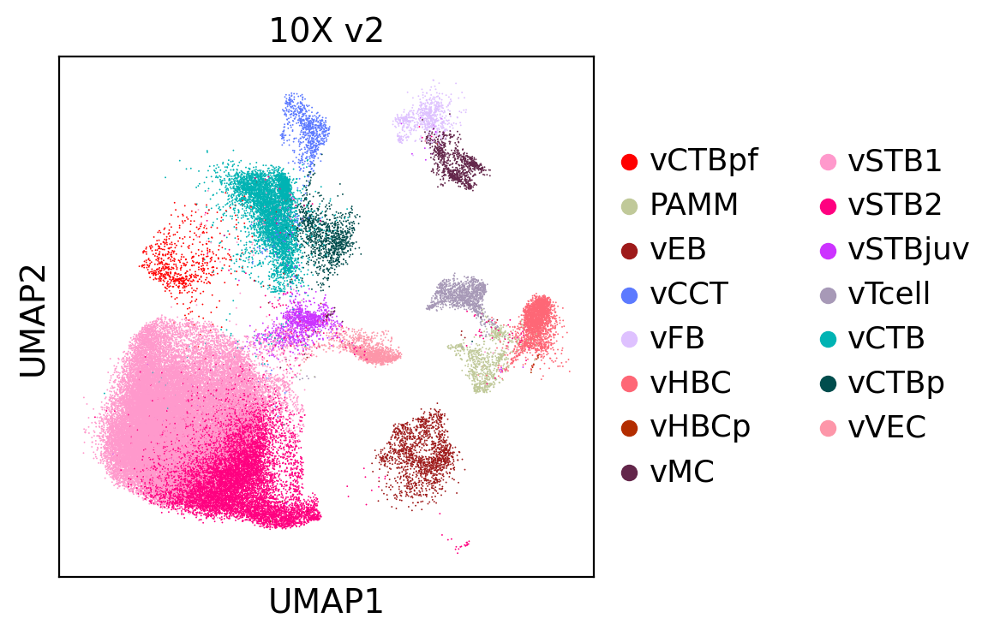

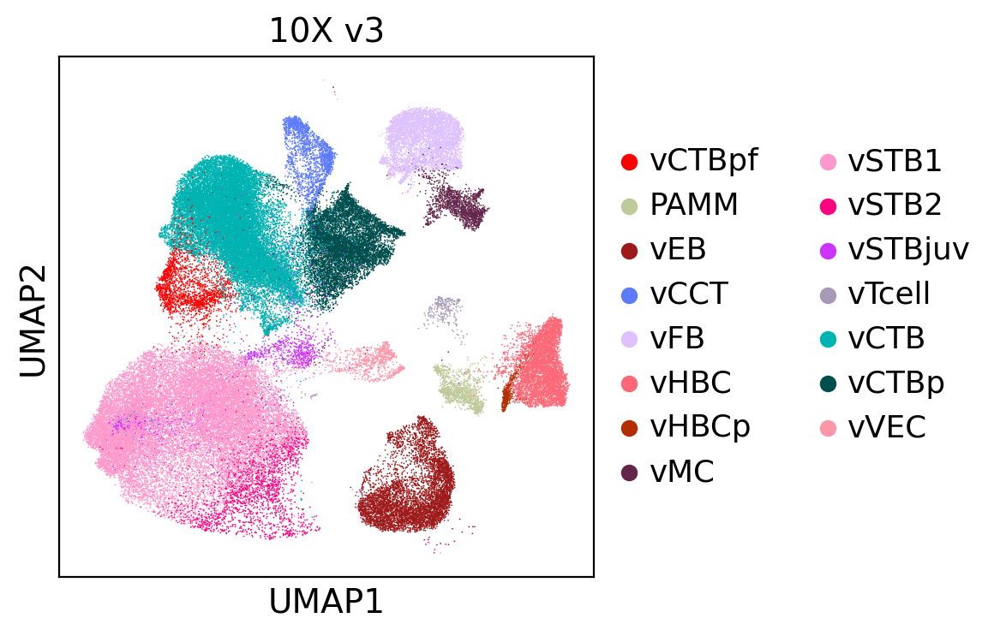

In [32]:
plt.rcParams["figure.figsize"] = (3,3)
sc.settings.set_figure_params(dpi=100, vector_friendly=True, transparent=True)


#Split by library chemistry (10X V3 & 10 V2): 
for i in adata_filter02.obs['library'].cat.categories:
    print(i) 
    fig= sc.pl.umap(adata_filter02[adata_filter02.obs['library'] == i], color = 'celltype_v1_reordered', return_fig=True, title= i)

early
late_preterm
late_term


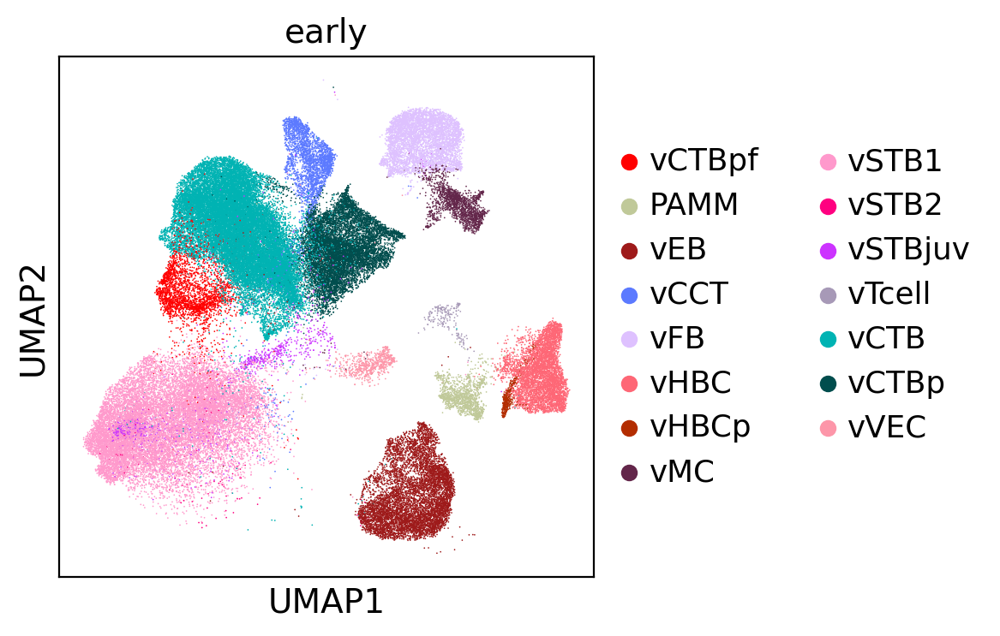

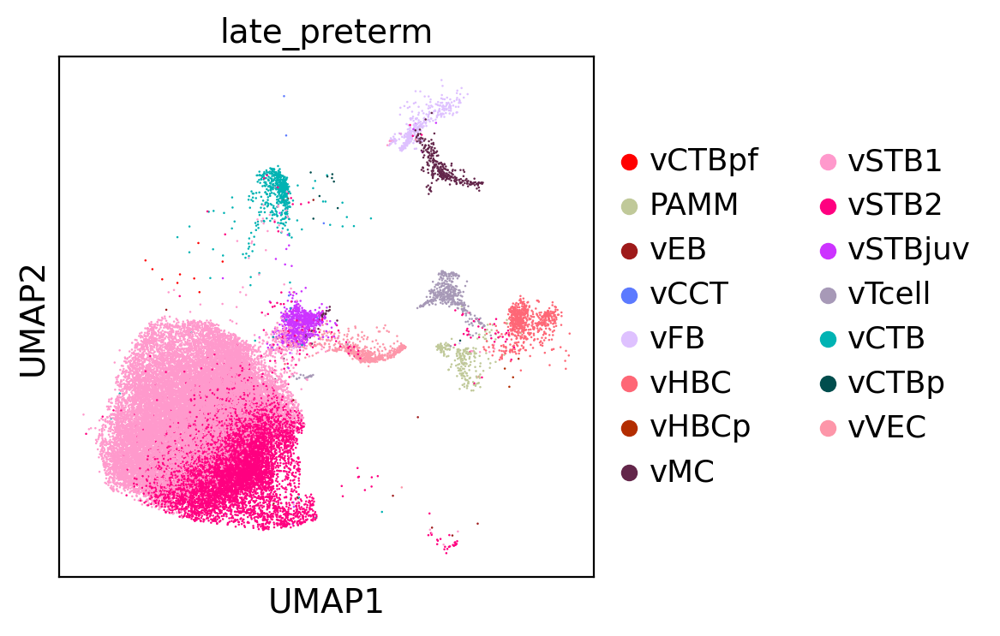

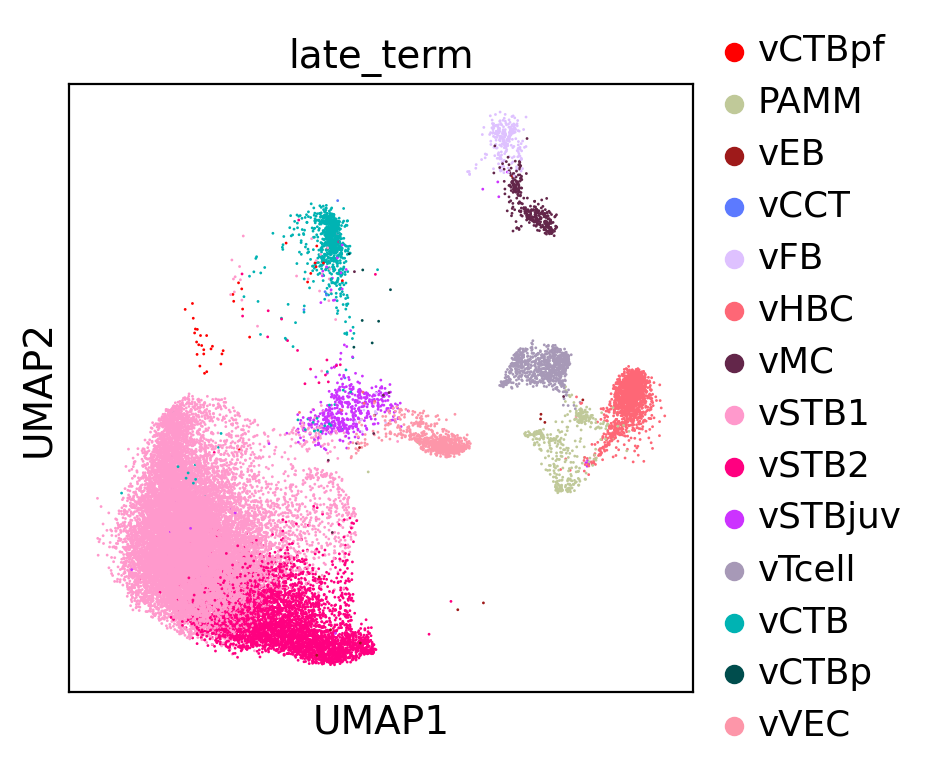

In [33]:
#Split by gestational time: 
import matplotlib.backends.backend_pdf
#pdf = matplotlib.backends.backend_pdf.PdfPages("Placenta_umap_gestation_240322.pdf")

for i in adata_filter02.obs['time'].cat.categories:
    print(i) 
    fig= sc.pl.umap(adata_filter02[adata_filter02.obs['time'] == i], color = 'celltype_v1_reordered', return_fig=True, title= i)
    #pdf.savefig(fig)
    
#pdf.close() 

17-025-v
17-022-v
17-021-v
18-082-01-v
18-108-02-v
18-032-v
18-017-v
18-033-v
18-098-v
20-027-v
327-v
328-v
372-v
TRM1-v
TRM2-v
TRM3-v
389-v
419-v
577-1-v
577-2-v
M181-v


/home/debnatho/anaconda3/envs/scvi_analysis/lib/python3.7/site-packages/scanpy/plotting/_tools/scatterplots.py:199: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = pl.figure()


PLA120-v


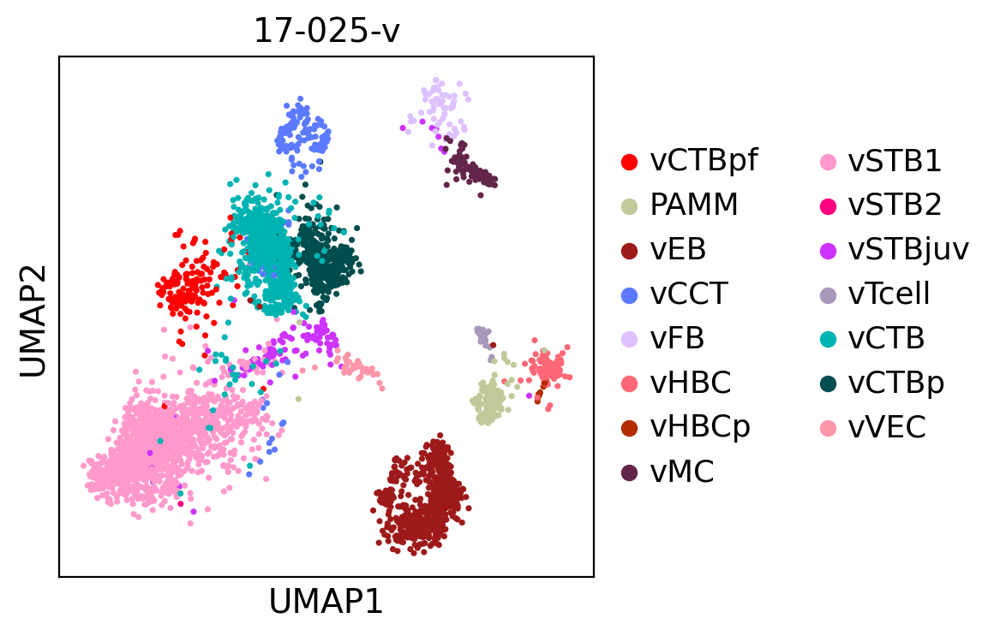

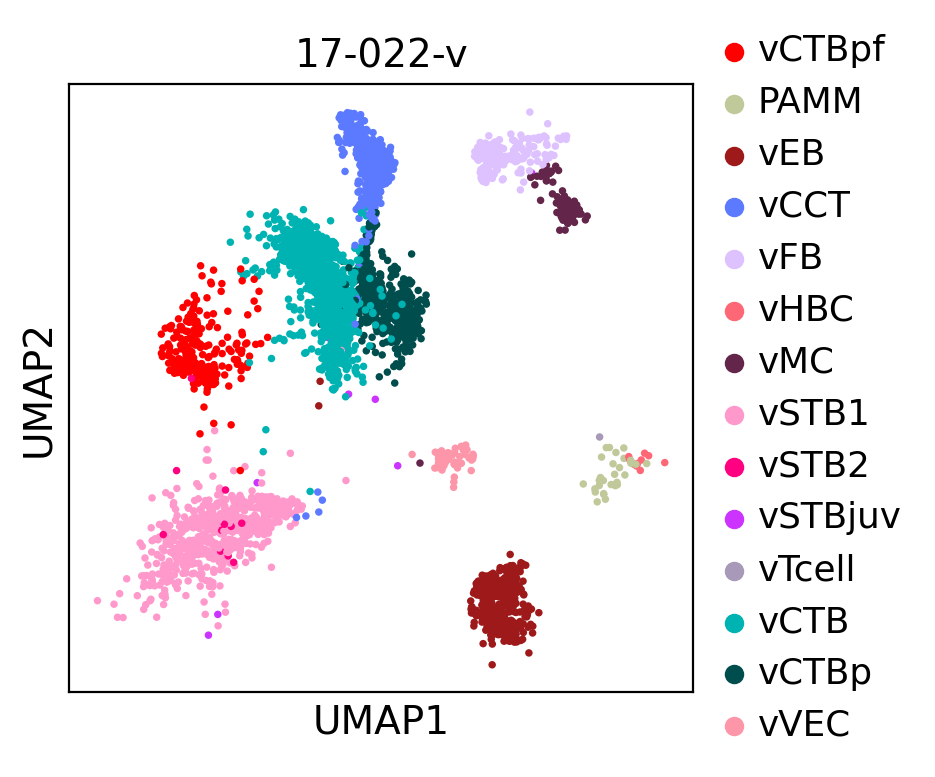

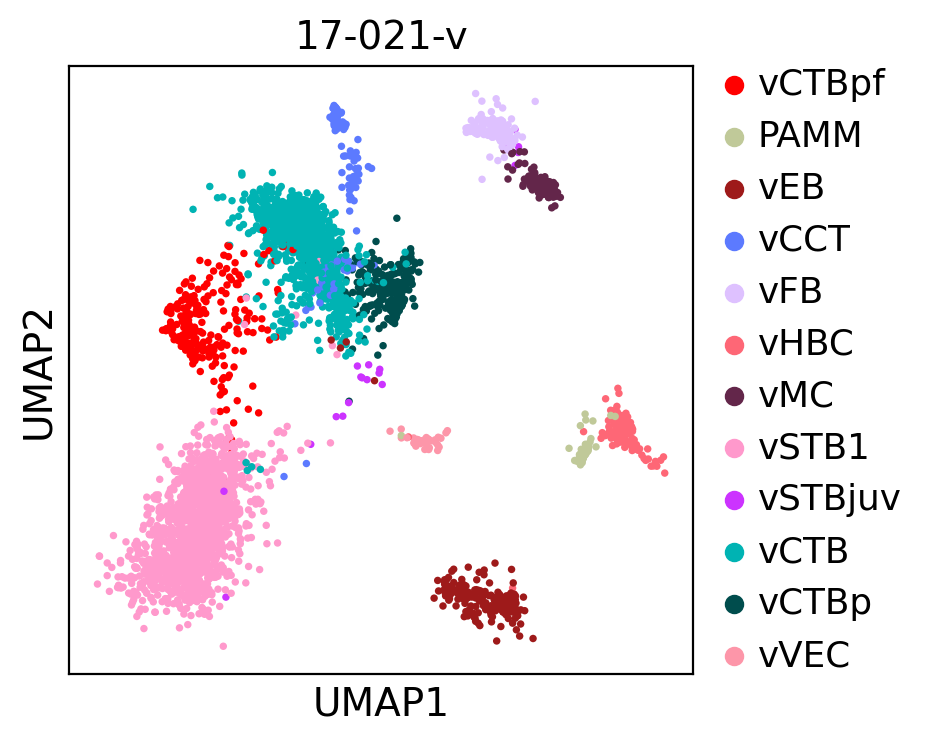

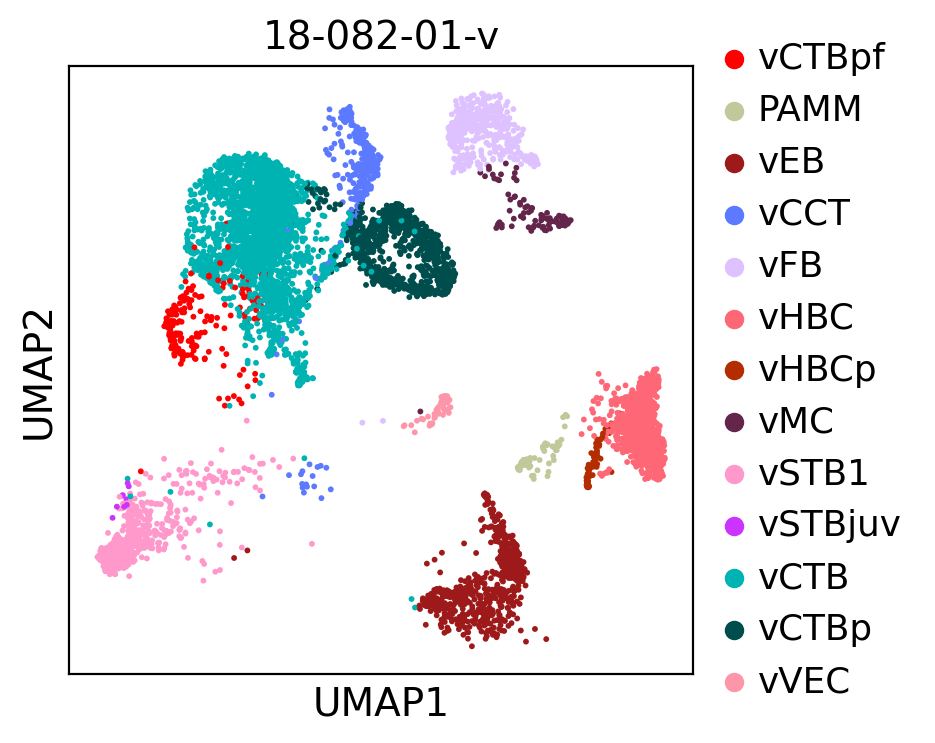

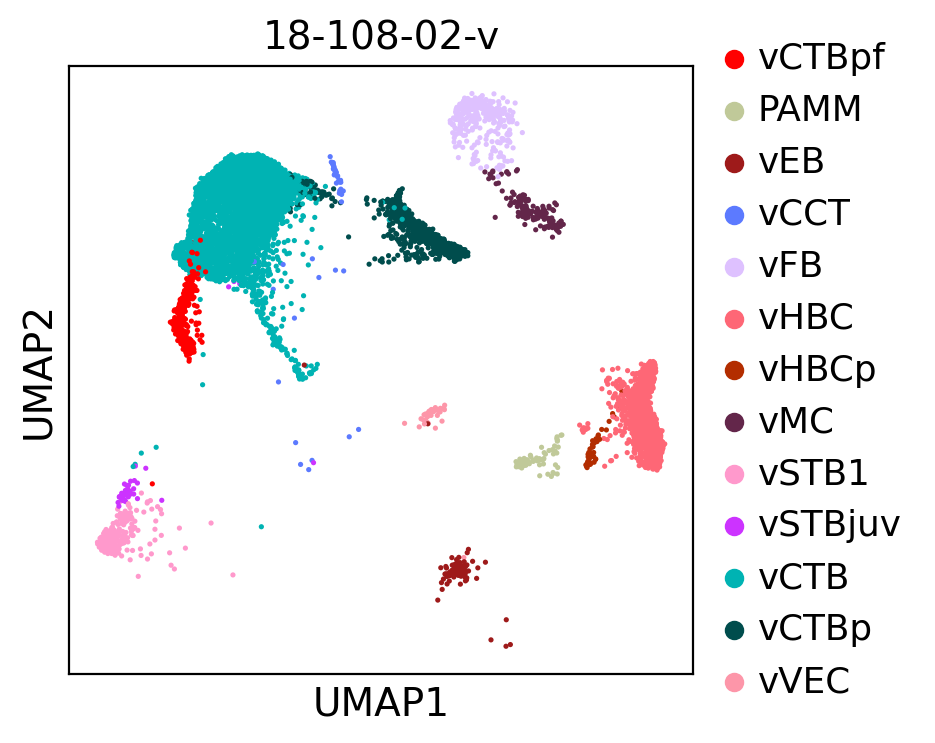

...

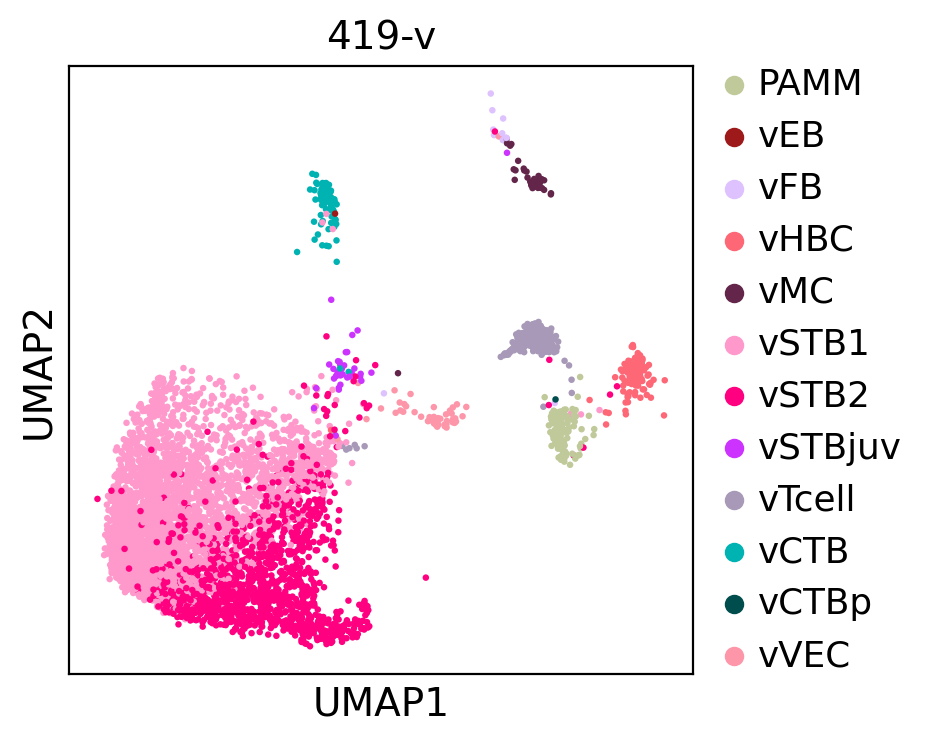

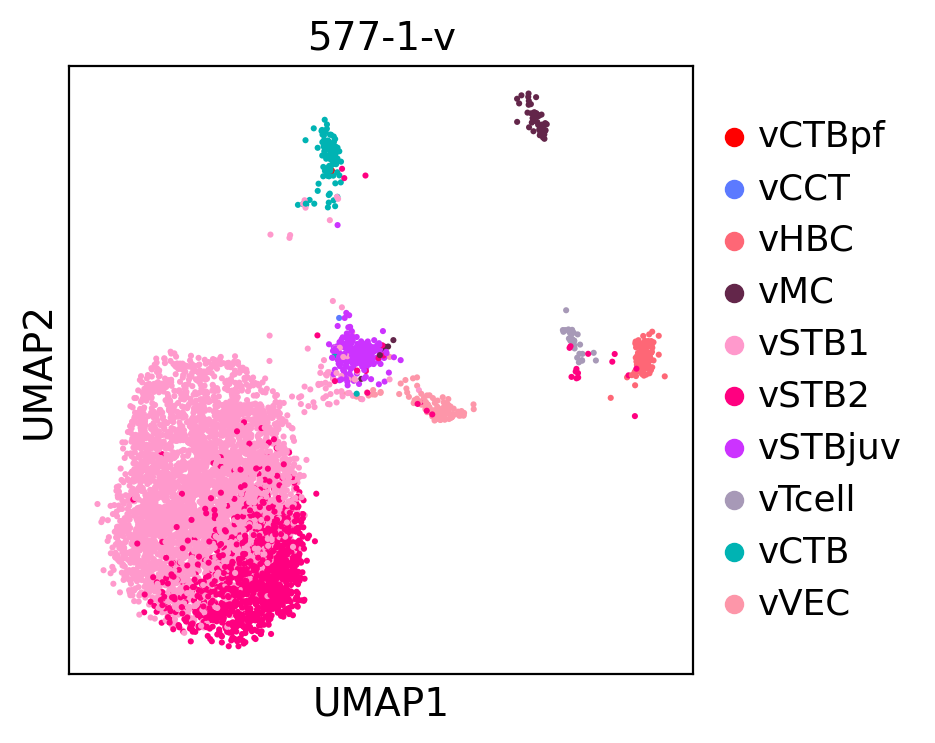

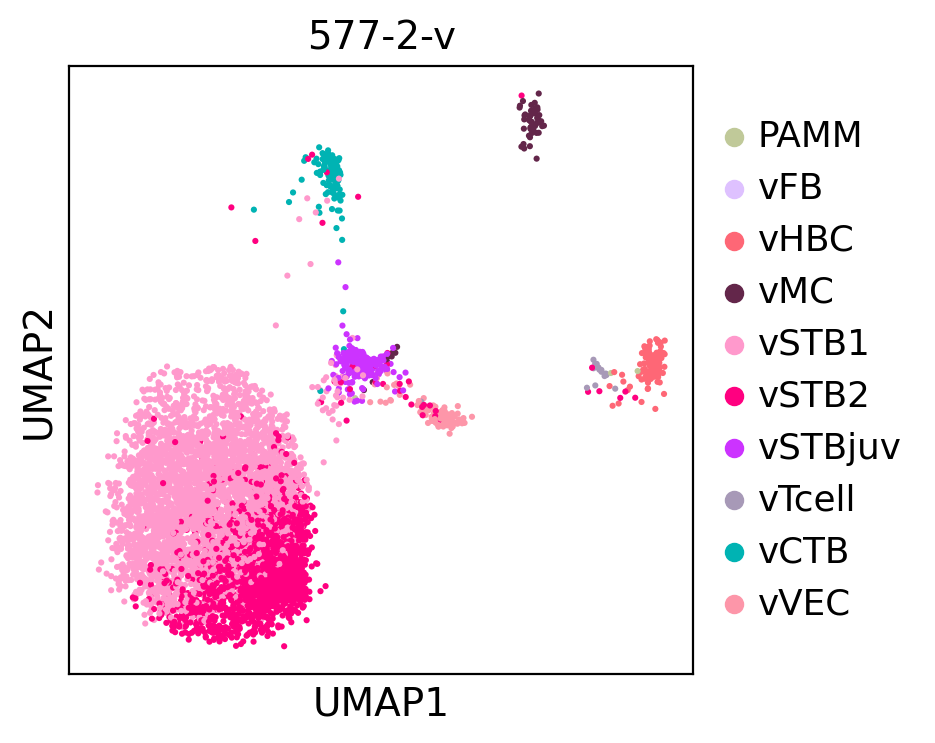

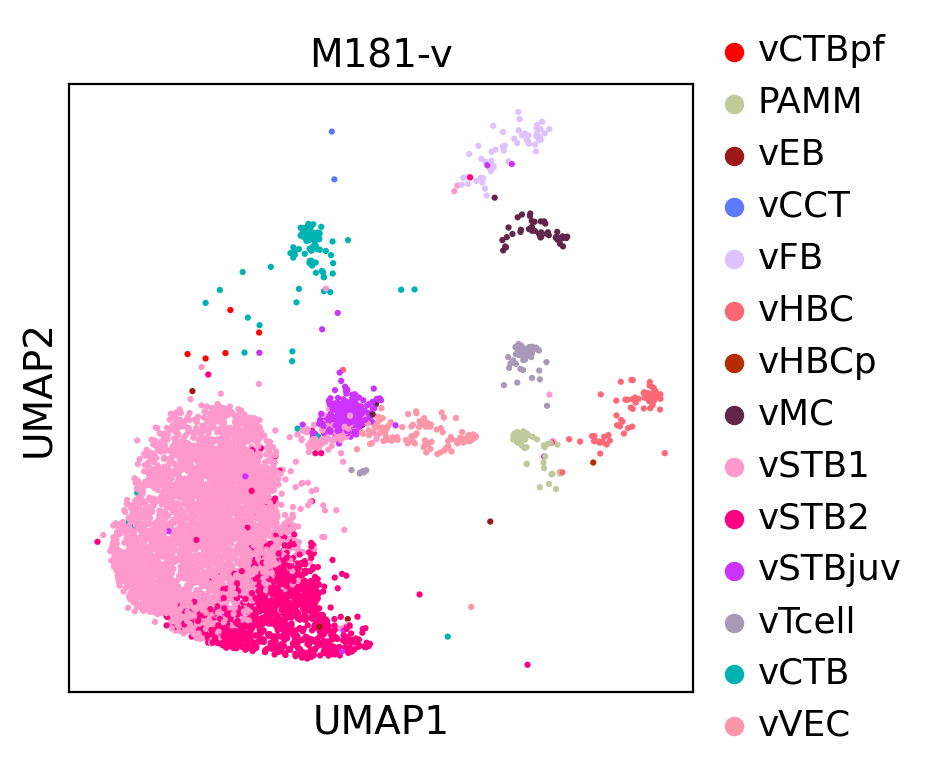

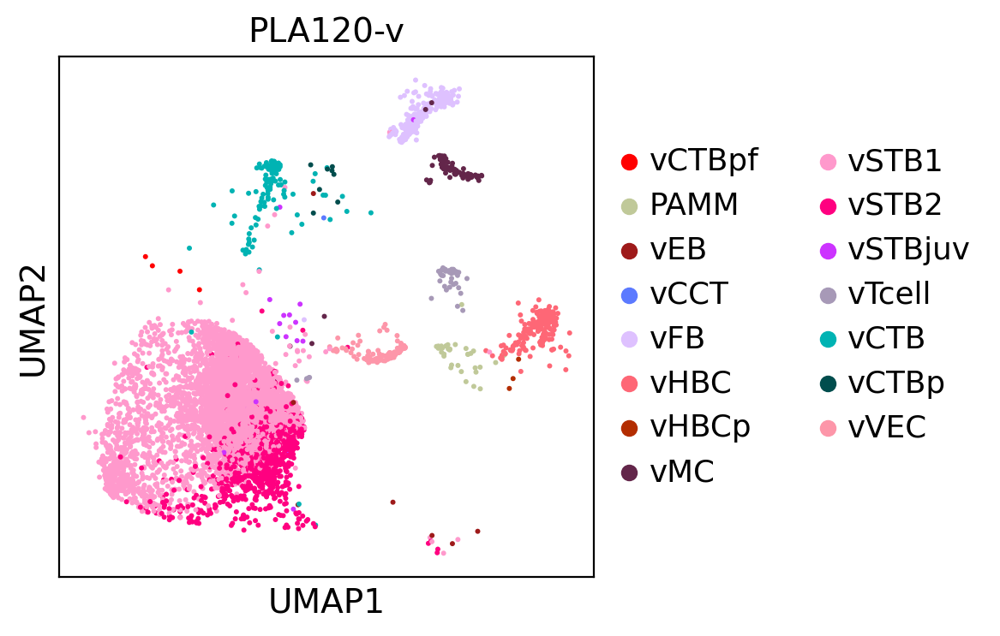

In [34]:
#Split by donor_id (renamed a/c manuscript): 
for i in adata_filter02.obs['donor_id_reordered'].cat.categories:
    print(i) 
    fig= sc.pl.umap(adata_filter02[adata_filter02.obs['donor_id_reordered'] == i], color = 'celltype_v1_reordered', return_fig=True, title= i)
    #pdf.savefig(fig)

In [35]:
#Reorder the renamed categories:
adata_filter02.obs['celltype_v2_reordered']= adata_filter02.obs['leiden_subclusters_refined02'].cat.reorder_categories(['vVCT_prol', 'vVCT', 'APAhi_tropho',
    'vSCTjuv', 'vSCT_1', 'vSCT_2', 'vEVT', 'vFB1', 'vMC', 'vVEC', 'vHBC', 'vHBC_prol', 'PAMM', 'vTcell', 'vEB1'])

adata_filter02.obs['celltype_v2_reordered'].cat.categories

Index(['vVCT_prol', 'vVCT', 'APAhi_tropho', 'vSCTjuv', 'vSCT_1', 'vSCT_2',
       'vEVT', 'vFB1', 'vMC', 'vVEC', 'vHBC', 'vHBC_prol', 'PAMM', 'vTcell',
       'vEB1'],
      dtype='object')

In [36]:
#Rename after the reordering of clusters: 
adata_filter02.obs['celltype_v2_reordered']= adata_filter02.obs['celltype_v2_reordered'].map(lambda x: {"APAhi_tropho": "vCTBpf",
"vSCTjuv": "vSTBjuv", "vSCT_1": "vSTB1", "vSCT_2": "vSTB2", "vVCT_prol": "vCTBp", "vVCT": "vCTB",
"vEVT": "vCCT", "vFB1": "vFB", "vEB1": "vEB", "vHBC_prol": "vHBCp"}.get(x, x)).astype("category")

adata_filter02.obs['celltype_v2_reordered'].cat.categories

Index(['vCTBp', 'vCTB', 'vCTBpf', 'vSTBjuv', 'vSTB1', 'vSTB2', 'vCCT', 'vFB',
       'vMC', 'vVEC', 'vHBC', 'vHBCp', 'PAMM', 'vTcell', 'vEB'],
      dtype='object')

Dot-plot for placenta/villi: Extended Data Figure 2A. 

Dot-plots featuring known and specific novel markers characterising each cell type or state in the villi (a). Markers are computed by Logistic Regression based Generalized Linear model (Bonferroni adjusted two-sided, P < 0.05 and log2FC cut-off of ±0.25). Genes are scaled across clusters for visualization. Placental F13A1+/FGF13+ resident macrophages (Hofbauer cells, vHBC) uniquely express hyaluronan receptor LYVE1 in the immune cell subset, suggested to maintain arterial tone and have pro-angiogenic functions [1,2]. We additionally identify antigen presenting HLA-DRA+ placenta associated maternal monocytes/macrophages (vPAMM) which are villi-associated and are extra-embryonic or maternal in origin. 

For the first time, we detected significant heterogeneity in the vSTB group. Notably, we found an interesting state termed as juvenile STB (vSTBjuv) marked by the expression of paternally imprinted DLK1 (regulator of cell growth and differentiation), SPARC, TMSB10, and ACTB which indicate an association with extracellular matrix remodelling and promotion of changes to cell shape. Interestingly, the juvenile nuclei robustly express the secretory phenotype (characterized by several PSGs and maternally 
imprinted TFPI2) and a classical STB like profile (expression of CGA, CYP19A1, KISS1, ADAM12, SDC1 and others) for which it was classified under vSTB group. 

vCTBp was considered as the trophoblast progenitor as they are actively cycling given the expression of genes like MKI67, TOP2A, STMN1 and CENPK/CENPE. Notably, they exhibit robust expression of YAP1, TEAD1, TP63, CCNA2, ITGA6- all known for their roles as trophoblast progenitor (bipotent as it can differentiate towards both vSTB & vCCT lineages). vCTBpf is primarily fusogenic and is characterized by very specific markers such as GREM2, ERVFRD-1, ERVV-1/2, OTUB2, and DYSF.

The villi myocytes (vMC) were identified given their AGTR1 expression.

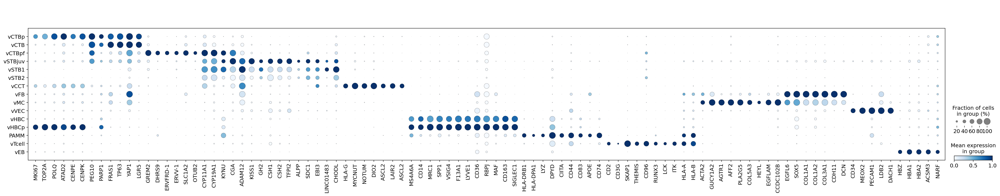

In [37]:
cell_markers= ['MKI67', 'TOP2A', 'POLQ','ATAD2', 'CENPE', 'CENPK', 
               'PEG10', 'PARP1', 'FRAS1', 'TP63', 'YAP1', 'LGR5', 
               'GREM2', 'DHRS9', 'ERVFRD-1', 'ERVV-1', 'SLC1A2', 'OTUB2', 'CYP11A1', 
               'CYP19A1', 'KYNU', 'CGA', 'ADAM12', 'KISS1', 'GH2','CSH1', 'CSH2', 'TFPI2', 
               'ALPP', 'SDC1', 'EBI3', 'LINC01483', 'CHODL',  
               'HLA-G', 'MYCNUT', 'NOTUM', 'DIO2', 'ASCL2', 'LAIR2', 
              'ASCL2', 'MS4A6A', 'CD14', 'MRC1', 'SPP1', 'VSIG4', 'F13A1', 'LYVE1', 'CD36', 'RBPJ', 'MAF', 'CD163', 
               'SIGLEC1', 'HLA-DRB1', 'HLA-DPA1', 'LYZ', 'DPYD', 'CIITA', 'CD44', 'CD83', 'APOE', 'CD74', 
               'CD2', 'CD3G', 'SKAP1', 'THEMIS', 'CD96', 'RUNX3', 'LCK', 'ITK', 'HLA-A', 'HLA-B', 
               'ACTA2', 'GUCY1A2', 'AGTR1', 'AFF2', 'PLA2G5', 'COL5A3', 'HEYL', 'EGFLAM', 'CCDC102B', 
               'EGFL6', 'SOX5', 'COL1A1','COL1A2', 'COL3A1', 'CDH11', 'DCN',
               'CD34', 'MEOX2', 'PECAM1', 'LDB2', 'DACH1',
               'HBZ', 'HBA1', 'HBA2', 'ACSM3', 'NARF']

sc.pl.dotplot(adata_filter02, cell_markers, groupby='celltype_v2_reordered', dendrogram=False, 
              color_map="Blues", use_raw=True, standard_scale="var") 

#PDF was saved under dpi=180. 
#sc.settings.set_figure_params(dpi_save=180, vector_friendly=True, transparent=True)

In [38]:
#Cell composition analysis segregated by gestational time points. 

def make_bar_plots(adata, anno_groupby = 'time',
                         anno_subsets = 'leiden_subclusters_refined02',
                         anno_pointdef = 'time',
                         save_file = 'placenta_comp_gestation_v2_2503222.pdf'):
    
    #Get the number of categories (here, gest. time): 
    labels = adata.obs[anno_groupby].cat.categories.tolist()
    n_labels = len(labels)
    subset_ids = adata.obs[anno_subsets].cat.categories.tolist()
    n_subsets = len(subset_ids)
    patient_ids = adata.obs[anno_pointdef].unique()
    n_patients = len(patient_ids)

    #Calculate subset fractions per group. 
    subset_frac = pd.DataFrame(np.empty([n_patients, n_subsets]),
                                    index = patient_ids ,
                                    columns = subset_ids)
    for i in np.arange(n_patients):
        ind2 = adata.obs[anno_pointdef] == patient_ids[i]
        for j in np.arange(n_subsets):
            ind1 = adata.obs[anno_subsets] == subset_ids[j]
            subset_frac.iloc[i,j] = sum(ind1&ind2)
    subset_frac = subset_frac.apply(lambda x: x/sum(x),axis=1)

    #Get donor labels: 
    patient_phenos = pd.DataFrame(index = subset_frac.index, columns=[anno_groupby])
    for i in range(0,len(labels)):
        p_list = adata.obs[anno_pointdef][adata.obs[anno_groupby] == labels[i]].unique().tolist()
        patient_phenos[anno_groupby][p_list] = labels[i]
    patient_phenos['time'] = patient_phenos['time'].astype('category')
    patient_phenos['time'] = patient_phenos['time'].cat.reorder_categories(labels)
    ord_ind = patient_phenos.sort_values('time', ascending=False).index

    subset_frac = subset_frac.loc[ord_ind]

    fig, axes = plt.subplots(1,1, figsize=(10,5))

    subset_frac.plot.barh(stacked=True, grid=False, legend=False, ax=axes, color= ['#ff0000', '#c0c999', '#9e1a1a', '#5c7aff', '#dec1ff', '#fe6776',
       '#b32d00', '#63264a', '#ff99cc', '#ff0080', '#cc33ff', '#a799b7', '#00b3b3', '#004d4d', '#fd96A9'])

    box = axes.get_position()
    axes.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    axes.legend(loc='lower right', bbox_to_anchor=(1.5, 0.5), frameon=True)
    sns.despine(left=True, bottom=True, right=True)
    plt.tight_layout()
    plt.savefig(save_file)

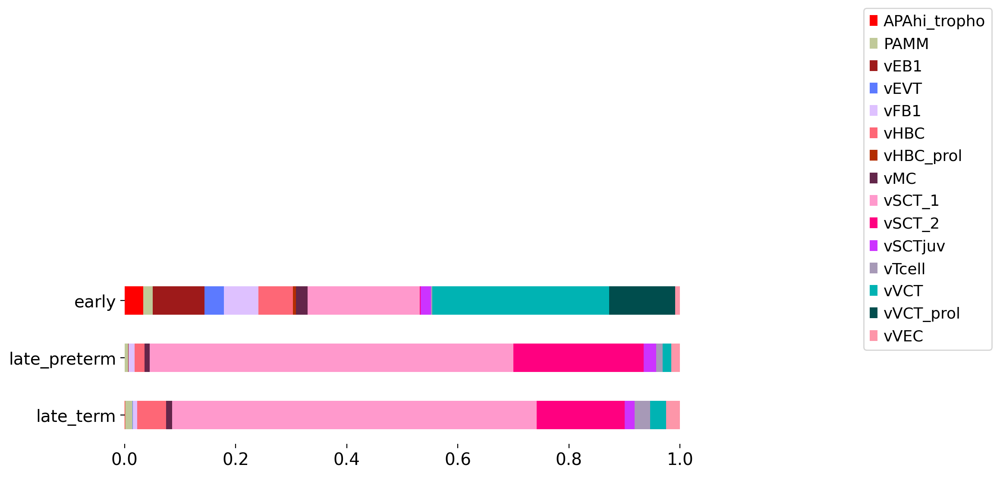

In [39]:
import seaborn as sns
make_bar_plots(adata_filter02)

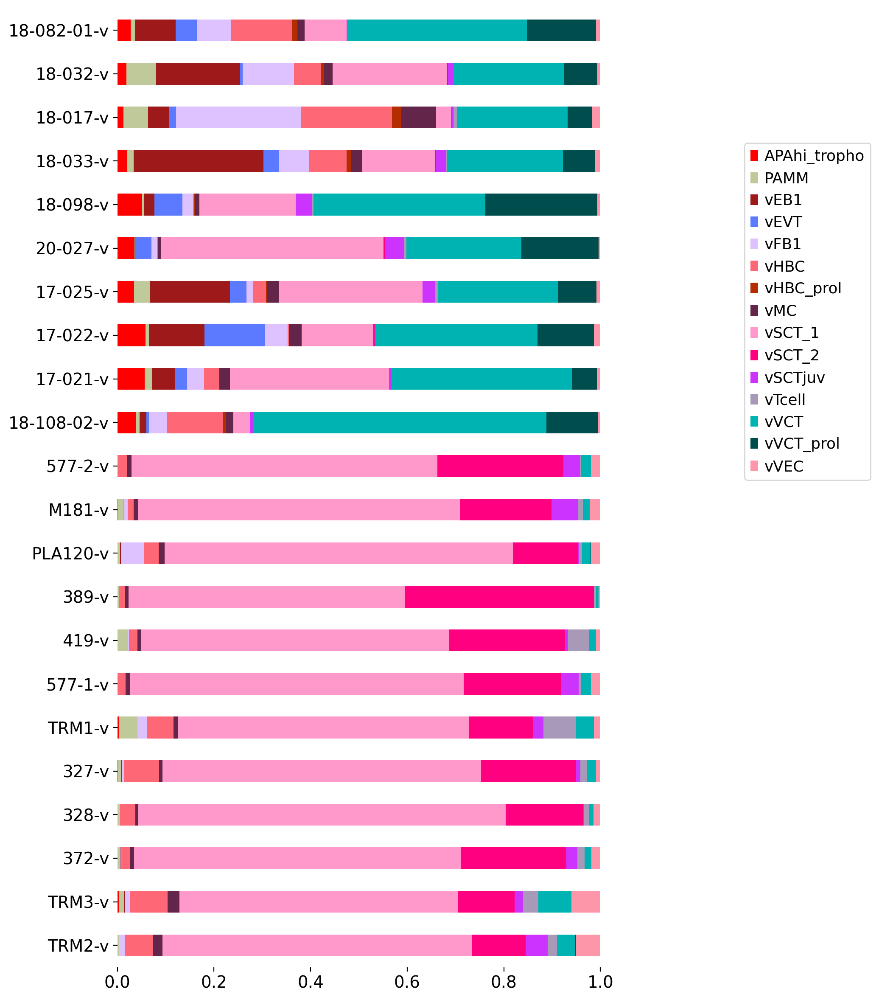

In [42]:
#Cell composition analysis segregated by donor_id: 
def make_bar_plots(adata, anno_groupby = 'time',
                         anno_subsets = 'leiden_subclusters_refined02',
                         anno_pointdef = 'donor_id_reordered',
                         save_file = 'Placenta_comp_donorID_250322.pdf'):
    
    ## Get number of categories
    labels = adata.obs[anno_groupby].cat.categories.tolist()
    n_labels = len(labels)
    subset_ids = adata.obs[anno_subsets].cat.categories.tolist()
    n_subsets = len(subset_ids)
    patient_ids = adata.obs[anno_pointdef].unique()
    n_patients = len(patient_ids)

    ## Calculate subset fractions
    subset_frac = pd.DataFrame(np.empty([n_patients, n_subsets]),
                                    index = patient_ids ,
                                    columns = subset_ids)
    for i in np.arange(n_patients):
        ind2 = adata.obs[anno_pointdef] == patient_ids[i]
        for j in np.arange(n_subsets):
            ind1 = adata.obs[anno_subsets] == subset_ids[j]
            subset_frac.iloc[i,j] = sum(ind1&ind2)
    subset_frac = subset_frac.apply(lambda x: x/sum(x),axis=1)

    ## Get patient labels
    patient_phenos = pd.DataFrame(index = subset_frac.index, columns=[anno_groupby])
    for i in range(0,len(labels)):
        p_list = adata.obs[anno_pointdef][adata.obs[anno_groupby] == labels[i]].unique().tolist()
        patient_phenos[anno_groupby][p_list] = labels[i]
    patient_phenos['time'] = patient_phenos['time'].astype('category')
    patient_phenos['time'] = patient_phenos['time'].cat.reorder_categories(labels)
    ord_ind = patient_phenos.sort_values('time', ascending=False).index

    subset_frac = subset_frac.loc[ord_ind]

    fig, axes = plt.subplots(1,1, figsize=(9,12))

    subset_frac.plot.barh(stacked=True, grid=False, legend=False, ax=axes, color= ['#ff0000', '#c0c999', '#9e1a1a', '#5c7aff', '#dec1ff', '#fe6776',
       '#b32d00', '#63264a', '#ff99cc', '#ff0080', '#cc33ff', '#a799b7', '#00b3b3', '#004d4d', '#fd96A9'])

    box = axes.get_position()
    axes.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    axes.legend(loc='lower right', bbox_to_anchor=(1.5, 0.5), frameon=True)
    sns.despine(left=True, bottom=True, right=True)
    plt.tight_layout()
    plt.savefig(save_file)

make_bar_plots(adata_filter02, anno_groupby = 'time', anno_pointdef = 'donor_id_reordered')

Figure on Extended 1D was rotated & further edited using GraphPad (acknowledgement: Daniela Valdes)

Calculate the density of cells in an embedding (per gestational time point).

Gaussian kernel density estimation is used to calculate the density of cells in an embedded space (here, UMAP). This can be performed per category over a categorical cell annotation. Note that density values are scaled to be between 0 and 1- hence, the value at each cell is only comparable to densities in the same category.

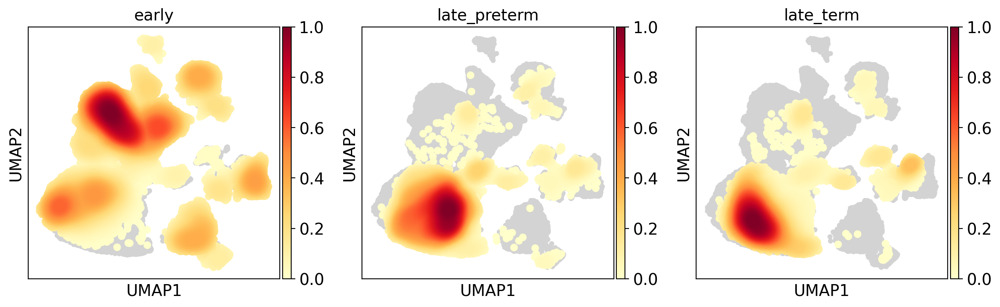

In [43]:
#Plot embedding density:
sc.tl.embedding_density(adata_villi, basis='umap', groupby= 'time')
sc.pl.embedding_density(adata_villi, basis='umap', key='umap_density_time') #save= 'Villi_KDE_gestation_240322.pdf'

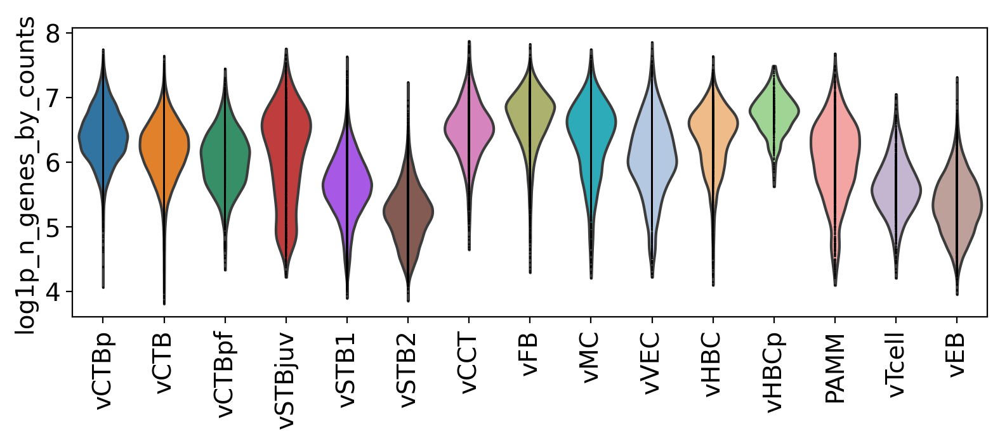

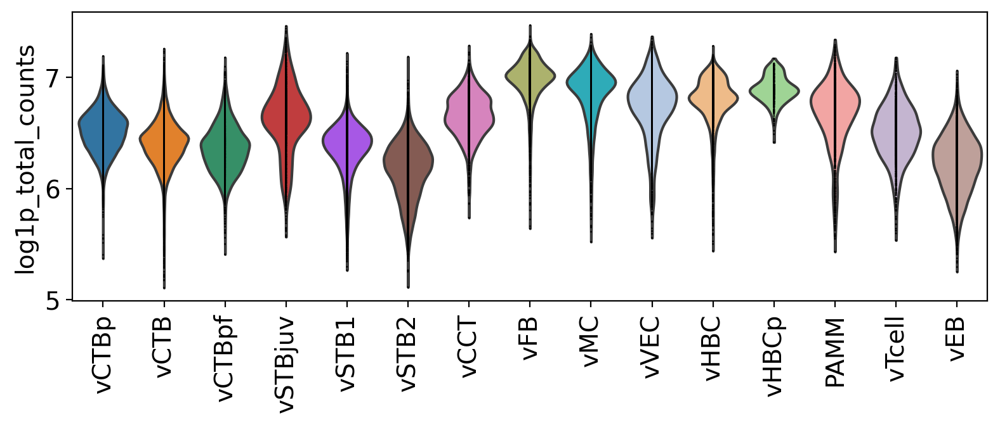

In [45]:
ldata_qc= adata_filter02.copy()

sc.settings.set_figure_params(dpi=100)
plt.rcParams["figure.figsize"] = (8,3)
plt.rcParams["axes.grid"] = False

#mitochondrial genes:
ldata_qc.var['MT_genes'] = ldata_qc.var_names.str.startswith('MT-') 

#ribosomal genes:
ldata_qc.var['Ribo_genes'] = ldata_qc.var_names.str.startswith(("RPS","RPL"))

#hemoglobin genes: 
ldata_qc.var['HB_genes'] = ldata_qc.var_names.str.contains(("^HB[^(P)]"))

#Calculate the QC using scanpy's in built function: 
sc.pp.calculate_qc_metrics(ldata_qc, qc_vars=['MT_genes','Ribo_genes','HB_genes'], percent_top=None, inplace=True)

#Cell type/state specific QC (not shown in manuscript): 
sc.pl.violin(ldata_qc, ['log1p_n_genes_by_counts'],jitter=0, groupby = 'celltype_v2_reordered', rotation= 90) #save= 'Villi_celltype_log1p_nGenes.pdf'
sc.pl.violin(ldata_qc, ['log1p_total_counts'],jitter=0, groupby = 'celltype_v2_reordered', rotation= 90) #save= 'Villi_celltype_log1p_totalcounts.pdf'

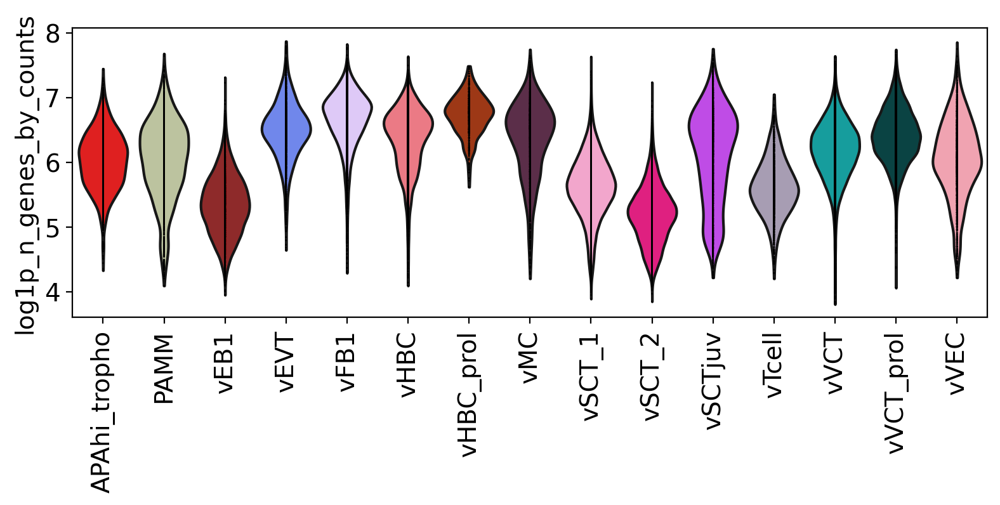

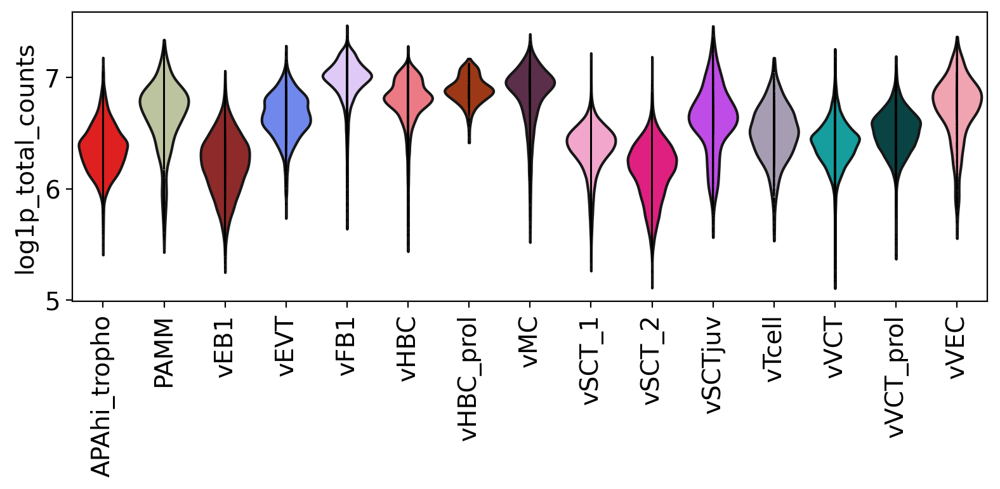

In [46]:
sc.pl.violin(ldata_qc, ['log1p_n_genes_by_counts'],jitter=0, groupby = 'leiden_subclusters_refined02', rotation= 90) #save= 'Villi_celltype_log1p_nGenes.pdf'
sc.pl.violin(ldata_qc, ['log1p_total_counts'],jitter=0, groupby = 'leiden_subclusters_refined02', rotation= 90) #save= 'Villi_celltype_log1p_totalcounts.pdf'

In [47]:
#Remove the technical replicate 557_2. 
adata_comp= adata_filter02[adata_filter02.obs['donor_id']!= 'Donor-557_2-villi']
adata_comp.obs['donor_id_reordered'].value_counts()

18-033-v       13559
18-098-v       12437
20-027-v       12304
18-108-02-v     8559
18-017-v        7217
18-082-01-v     6807
PLA120-v        6499
577-1-v         6185
18-032-v        6154
TRM1-v          6098
389-v           5971
M181-v          5866
328-v           5578
327-v           5571
419-v           5448
372-v           4584
17-025-v        4573
17-021-v        4168
17-022-v        4107
TRM2-v          4084
TRM3-v          3787
Name: donor_id_reordered, dtype: int64

In [48]:
adata_comp.obs['celltype_v1']= adata_comp.obs['celltype_v2_reordered']

Trying to set attribute `.obs` of view, copying.


In [49]:
#Save the cell type/state composition for manuscript (segregated by different conditions):
#After excluding 557_2 technical replicate. 
adata_comp.obs['celltype_v2_reordered'].value_counts().to_csv('./villi_composition_2022/Villi_celltype_composition_all_v2.csv')
pd.crosstab(adata_comp.obs['celltype_v1'], adata_comp.obs['disease']).to_csv('./villi_composition_2022/Villi_composition_condition_v2_2022.csv')
pd.crosstab(adata_comp.obs['celltype_v1'], adata_comp.obs['time']).to_csv('./villi_composition_2022/Villi_composition_gestation_v2_2022.csv')

In [50]:
#Reported under SupplementaryTable2:

pd.crosstab(adata_comp.obs['celltype_v1'], adata_comp.obs['donor_id_reordered'])

donor_id_reordered,17-025-v,17-022-v,17-021-v,18-082-01-v,18-108-02-v,18-032-v,18-017-v,18-033-v,18-098-v,20-027-v,...,328-v,372-v,TRM1-v,TRM2-v,TRM3-v,389-v,419-v,577-1-v,M181-v,PLA120-v
celltype_v1,,,,,,,,,,,,,,,,,,,,,
vCTBp,366,482,214,977,915,421,368,900,2884,1965,...,0,0,0,7,0,0,1,0,0,8
vCTB,1134,1373,1558,2534,5207,1408,1658,3246,4424,2932,...,47,66,220,156,259,30,74,128,84,111
vCTBpf,156,238,237,186,322,115,91,283,641,427,...,1,0,18,0,13,0,0,1,6,4
vSTBjuv,119,10,21,9,41,70,24,286,420,492,...,9,106,127,186,66,3,34,226,318,16
vSTB1,1357,608,1372,591,300,1451,230,2051,2478,5678,...,4243,3100,3677,2615,2184,3417,3475,4269,3913,4683
vSTB2,1,11,0,0,0,20,6,23,7,36,...,897,1000,808,456,442,2332,1308,1248,1112,872
vCCT,159,516,105,304,48,33,101,429,722,407,...,0,0,0,0,5,1,0,1,2,1
vFB,58,192,147,476,317,655,1861,845,276,138,...,8,8,114,55,34,4,13,0,54,307
vMC,114,107,92,97,138,111,523,317,120,68,...,35,36,55,81,94,41,39,59,52,77


Supplementary Table 2: Cell type or state composition per biological sample sequenced

Nuclei number contribution per biological replicate annotated to a specific cell type or state in the maternal fetal interface. Contributions are tabulated as absolute and relative values and separated by gestational age timepoint and condition. Tabs separate tissue of origin. The % values are added on MS Excel. 

In [51]:
pd.crosstab(adata_comp.obs['celltype_v1'], adata_comp.obs['donor_id_reordered']).to_csv('./villi_composition_2022/SupplTable2_villi_v2_2022.csv')

In [52]:
adata_st= adata_filter02.copy()

adata_st.raw.X

<145637x26202 sparse matrix of type '<class 'numpy.float32'>'
	with 311168484 stored elements in Compressed Sparse Row format>

In [ ]:
#Save the updated anndata for further analysis & share with Sebastian for ISS:
#results= "/data/analysis/preeclampsia_2019/spatial_data/SP014_SP082_SP136_placenta_annotations_250322.h5ad" (old)
#results= "/dh-projects/preeclampsia_2022/analysis/spatial_data/SP014_SP082_SP136_placenta_annotations_250322.h5ad" (new location)
#adata_st.write(results)

Cell composition analysis: Extended Data figure 2e & 2f. 

Figure description:
(e) Box plots comparing composition per cell type or state compared between early and late control (lateC) pregnancy samples. (f) Box plots comparing composition per cell type or state compared between late control and early onset pre-eclampsia (eoPE).
False discovery rate (FDR) < 0.05 indicate significant composition shift in cell 
proportions between each comparison pair. Here, boxplots reveal fractional abundances of cell types/states for late gestation relative to early; and eoPE relative to late-term controls in (e). FDR 
was calculated using two-tailed Wilcoxon rank-sum test and corrected for multiple testing of states. Boxes reveal the median and IQR for each condition, with whiskers spanning to 1.5 IQR (from 
both the top and bottom quartile). 

In [53]:
#Read the above anndata for composition analysis: 
results_scvi= "/dh-projects/preeclampsia_2022/analysis/spatial_data/SP014_SP082_SP136_placenta_annotations_250322.h5ad"
adata_villi= sc.read_h5ad(results_scvi)

In [54]:
#Filter the 557_2 technical replicate:
adata_filter= adata_villi[adata_villi.obs['donor_id']!= 'Donor-557_2-villi']

In [55]:
#Rename the gestational/disease time point values:
adata_filter.obs['condition']= adata_filter.obs['time'].map(lambda x: {"early": "Early", "late_preterm": "PE",
"late_term": "LateC"}.get(x, x)).astype("category")

adata_filter.obs['condition'].value_counts()

Trying to set attribute `.obs` of view, copying.


Early    79885
PE       29969
LateC    29702
Name: condition, dtype: int64

In [56]:
#Reload necessary packages:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import scipy as sp

import h5py
import warnings
import random
import math

from matplotlib import rcParams
from matplotlib import cm
from statsmodels.stats.multitest import multipletests
from scipy import stats

In [57]:
adata_filter.obs['donor_id_reordered'].cat.categories

Index(['17-025-v', '17-022-v', '17-021-v', '18-082-01-v', '18-108-02-v',
       '18-032-v', '18-017-v', '18-033-v', '18-098-v', '20-027-v', '327-v',
       '328-v', '372-v', 'TRM1-v', 'TRM2-v', 'TRM3-v', '389-v', '419-v',
       '577-1-v', 'M181-v', 'PLA120-v'],
      dtype='object')

In [58]:
#Plot relative abundances:
#Inspired by the Broad's sepsis paper. 
def villi_abundance_plots (adata, anno_groupby = 'condition',
                          anno_subsets = 'leiden_subclusters_refined02',
                          anno_pointdef = 'donor_id_reordered',
                          save_file = 'Villi_relative_abundance_v2_010422.pdf'):

    #Fetch number of categories per condition: 
    labels = adata.obs[anno_groupby].cat.categories.tolist()
    n_labels = len(labels)
    subset_ids = adata.obs[anno_subsets].cat.categories.tolist()
    n_subsets = len(subset_ids)
    patient_ids = adata.obs[anno_pointdef].unique()
    n_patients = len(patient_ids)

    #Calculate subset fractions of cell type/states: 
    subset_frac = pd.DataFrame(np.empty([n_patients, n_subsets]),
                                    index = patient_ids ,
                                    columns = subset_ids)
    for i in np.arange(n_patients):
        ind2 = adata.obs[anno_pointdef] == patient_ids[i]
        for j in np.arange(n_subsets):
            ind1 = adata.obs[anno_subsets] == subset_ids[j]
            subset_frac.iloc[i,j] = sum(ind1&ind2)
    subset_frac = subset_frac.apply(lambda x: x/sum(x),axis=1)

    # Get patient/donor labels:
    patient_phenos = pd.DataFrame(index = subset_frac.index, columns=[anno_groupby])
    for i in range(0,len(labels)):
        p_list = adata.obs[anno_pointdef][adata.obs[anno_groupby] == labels[i]].unique().tolist()
        patient_phenos[anno_groupby][p_list] = labels[i]
    subset_frac_labeled = patient_phenos.join(subset_frac)
    subset_frac_labeled[anno_groupby] = subset_frac_labeled[anno_groupby].astype('category')
    subset_frac_labeled[anno_groupby] = subset_frac_labeled[anno_groupby].cat.reorder_categories(labels)
    subset_frac_labeled['PE'] = 'False'
    
    #Label the PE samples:  
    subset_frac_labeled['PE'][subset_frac_labeled.index.isin(['389-v', '419-v','577-1-v', 'M181-v', 'PLA120-v'])] = 'True'
    subset_frac_labeled[anno_groupby] = subset_frac_labeled[anno_groupby].astype('category')
    subset_frac_labeled[anno_groupby] = subset_frac_labeled[anno_groupby].cat.reorder_categories(labels)

    #Create boxplots: 
    pvals = np.empty([n_labels-1,n_subsets])
    plt.figure(figsize=(20,4*math.ceil(n_subsets/5)))
    for i in np.arange(n_subsets):
        cluster_fracs = [[] for i in range(n_labels)]
        plt.subplot(math.ceil(n_subsets/5),5,i+1)
        for j in np.arange(n_labels):
            cluster_fracs[j] = subset_frac_labeled[subset_ids[i]][subset_frac_labeled[anno_groupby]==labels[j]].values
        for j in np.arange(n_labels-1):    
            _, pvals[j,i] = stats.ranksums(cluster_fracs[0],cluster_fracs[j+1])
    
        sns.boxplot(x=anno_groupby,y=subset_ids[i], data= subset_frac_labeled, fliersize=0, 
                    width= 0.5, color='white')
        sns.swarmplot(x=anno_groupby, y=subset_ids[i], data= subset_frac_labeled[subset_frac_labeled['PE']=='False'],
                      size=5)
        sns.swarmplot(x=anno_groupby, y=subset_ids[i], data= subset_frac_labeled[subset_frac_labeled['PE']=='True'],
                      color='k', size=5)
        
        plt.xticks(rotation=90)
        plt.xlabel(None)
        plt.grid(False, axis='both')
        _ , pvals[:,i], _ , _ = multipletests(pvals[:,i], method='fdr_bh') #Benjamini/Hochberg correction for multiple testing (non-negative)
    for i in np.arange(n_subsets):
        plt.subplot(math.ceil(n_subsets/5),5,i+1)
        plt.title(str(subset_ids[i])+'\n'+
                 "FDR= "+' '.join(['{:.3f}'.format(x) if x > 0.01 else '<.01' for x in pvals[:,i]]), fontsize=9.5)
    plt.tight_layout()
    plt.savefig(save_file) 

In [59]:
#Rename clusters: 
adata_filter.obs['celltype_v2_reordered']= adata_filter.obs['leiden_subclusters_refined02'].map(lambda x: {"APAhi_tropho": "vCTBpf",
"vSCTjuv": "vSTBjuv", "vSCT_1": "vSTB1", "vSCT_2": "vSTB2", "vVCT_prol": "vCTBp", "vVCT": "vCTB",
"vEVT": "vCCT", "vFB1": "vFB", "vEB1": "vEB", "vHBC_prol": "vHBCp"}.get(x, x)).astype("category")

adata_filter.obs['celltype_v2_reordered'].cat.categories

Index(['vCTBpf', 'PAMM', 'vEB', 'vCCT', 'vFB', 'vHBC', 'vHBCp', 'vMC', 'vSTB1',
       'vSTB2', 'vSTBjuv', 'vTcell', 'vCTB', 'vCTBp', 'vVEC'],
      dtype='object')

In [61]:
adata_filter.obs['condition_reordered']= adata_filter.obs['condition'].cat.reorder_categories(['Early', 'LateC', 'PE']) 
    
#Subset the Controls (for figure 2e): 
adata_control= adata_filter[adata_filter.obs['disease']== 'C']

#Subset term controls & eoPE (for figure 2f):
adata_pe= adata_filter[adata_filter.obs['condition'].isin(['LateC', 'PE'])]
adata_pe.obs['condition_reordered'].value_counts()

PE       29969
LateC    29702
Name: condition_reordered, dtype: int64

/home/debnatho/anaconda3/envs/scvi_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/debnatho/anaconda3/envs/scvi_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


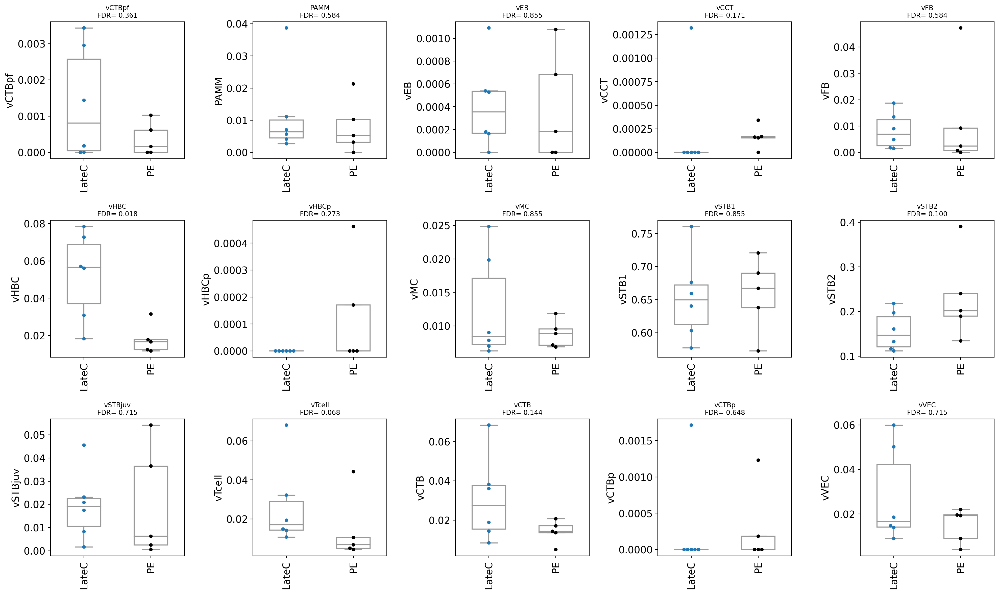

In [63]:
#Analysis for term Controls vs eoPE (figure 2f): 
villi_abundance_plots(adata_pe, anno_groupby= 'condition_reordered', anno_subsets= 'celltype_v2_reordered')

Since vCTBp & vCCT are extremely sparse in term controls as well as eoPE given the placenta physiology in late gestation, it is recommended to not interpret their FDR.  

In [64]:
#For Early vs term controls (healthy):
def abundance_plots (adata, anno_groupby = 'condition_reordered',
                          anno_subsets = 'celltype_v2_reordered',
                          anno_pointdef = 'donor_id_reordered',
                          save_file = 'Villi_RA_early_vs_lateC_v2_010422.pdf'):

    
    labels = adata.obs[anno_groupby].cat.categories.tolist()
    n_labels = len(labels)
    subset_ids = adata.obs[anno_subsets].cat.categories.tolist()
    n_subsets = len(subset_ids)
    patient_ids = adata.obs[anno_pointdef].unique()
    n_patients = len(patient_ids)

    #Calculate subset fractions
    subset_frac = pd.DataFrame(np.empty([n_patients, n_subsets]),
                                    index = patient_ids ,
                                    columns = subset_ids)
    for i in np.arange(n_patients):
        ind2 = adata.obs[anno_pointdef] == patient_ids[i]
        for j in np.arange(n_subsets):
            ind1 = adata.obs[anno_subsets] == subset_ids[j]
            subset_frac.iloc[i,j] = sum(ind1&ind2)
    subset_frac = subset_frac.apply(lambda x: x/sum(x),axis=1)

    
    patient_phenos = pd.DataFrame(index = subset_frac.index, columns=[anno_groupby])
    for i in range(0,len(labels)):
        p_list = adata.obs[anno_pointdef][adata.obs[anno_groupby] == labels[i]].unique().tolist()
        patient_phenos[anno_groupby][p_list] = labels[i]
    subset_frac_labeled = patient_phenos.join(subset_frac)
    subset_frac_labeled[anno_groupby] = subset_frac_labeled[anno_groupby].astype('category')
    subset_frac_labeled[anno_groupby] = subset_frac_labeled[anno_groupby].cat.reorder_categories(labels)
    subset_frac_labeled['LateC'] = 'False'
    
    #Label the term control samples:  
    subset_frac_labeled['LateC'][subset_frac_labeled.index.isin(['327-v','328-v', '372-v', 'TRM1-v', 
                                                                 'TRM2-v', 'TRM3-v'])] = 'True'
    subset_frac_labeled[anno_groupby] = subset_frac_labeled[anno_groupby].astype('category')
    subset_frac_labeled[anno_groupby] = subset_frac_labeled[anno_groupby].cat.reorder_categories(labels)

    #Create box-plots: 
    pvals = np.empty([n_labels-1,n_subsets])
    plt.figure(figsize=(20,4*math.ceil(n_subsets/5)))
    for i in np.arange(n_subsets):
        cluster_fracs = [[] for i in range(n_labels)]
        plt.subplot(math.ceil(n_subsets/5),5,i+1)
        for j in np.arange(n_labels):
            cluster_fracs[j] = subset_frac_labeled[subset_ids[i]][subset_frac_labeled[anno_groupby]==labels[j]].values
        for j in np.arange(n_labels-1):    
            _, pvals[j,i] = stats.ranksums(cluster_fracs[0],cluster_fracs[j+1])
    
        sns.boxplot(x=anno_groupby,y=subset_ids[i], data= subset_frac_labeled, fliersize=0, 
                    width= 0.5, color='white')
        sns.swarmplot(x=anno_groupby, y=subset_ids[i], data= subset_frac_labeled[subset_frac_labeled['LateC']=='False'],
                      size=5)
        sns.swarmplot(x=anno_groupby, y=subset_ids[i], data= subset_frac_labeled[subset_frac_labeled['LateC']=='True'],
                      color='k', size=5)
        
        plt.xticks(rotation=90)
        plt.xlabel(None)
        plt.grid(False, axis='both')
        _ , pvals[:,i], _ , _ = multipletests(pvals[:,i], method='fdr_bh') #Benjamini/Hochberg (non-negative)
    for i in np.arange(n_subsets):
        plt.subplot(math.ceil(n_subsets/5),5,i+1)
        plt.title(str(subset_ids[i])+'\n'+
                 "FDR= "+' '.join(['{:.3f}'.format(x) if x > 0.01 else '<.01' for x in pvals[:,i]]), fontsize=9.5)
    plt.tight_layout()
    plt.savefig(save_file)

/home/debnatho/anaconda3/envs/scvi_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/debnatho/anaconda3/envs/scvi_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


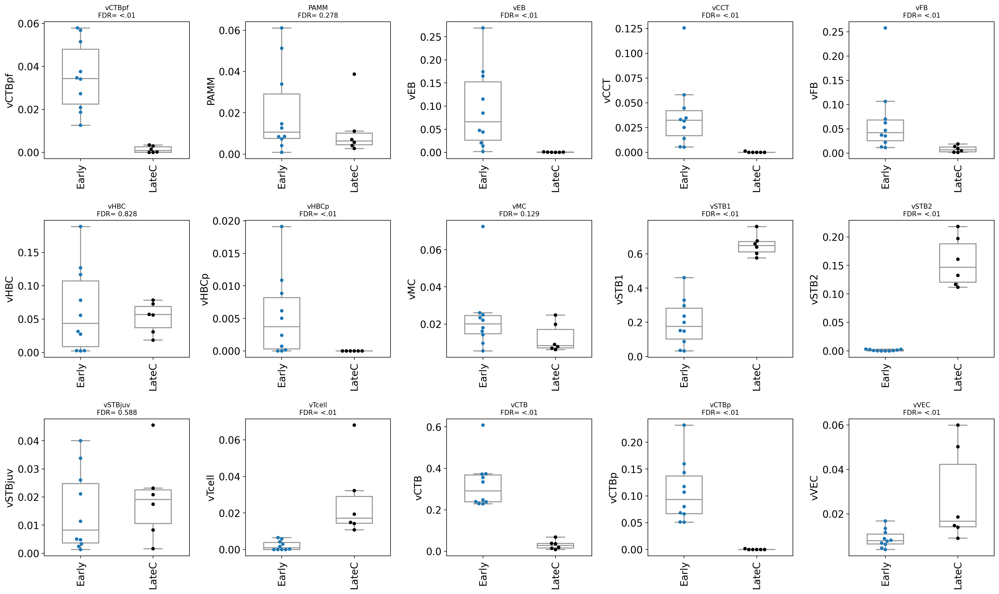

In [66]:
#Figure 2e (villi controls):
#Cell composition shift between early & late controls is highly significant for most cell types (except for vHBC, vPAMM & vSTBjuv)
abundance_plots(adata_control, 
                    anno_groupby= 'condition_reordered', anno_subsets= 'celltype_v2_reordered')

Evaluation of scVI integration (batch effect correction):
    
1). Rand index adjusted for chance (ARI): The Rand Index computes a similarity measure between two clusterings by considering all pairs of samples and counting pairs that are assigned in the same or different clusters in the predicted and true clusterings.

2). Adjusted Mutual Information between two clusterings: adjustment of the Mutual Information (MI) score to account for chance. It accounts for the fact that the MI is generally higher for two clusterings with a larger number of clusters, regardless of whether there is actually more information shared. This metric is independent of the absolute values of the labels: a permutation of the class or cluster label values won’t change the score value in any way.

In [67]:
from sklearn.metrics.cluster import adjusted_rand_score

print(adjusted_rand_score(adata_filter.obs['leiden_subclusters_refined02'], adata_filter.obs['donor_id'])) 
print(adjusted_rand_score(adata_filter.obs['leiden_subclusters_refined02'], adata_filter.obs['condition'])) 
print(adjusted_rand_score(adata_filter.obs['leiden_subclusters_refined02'], adata_filter.obs['library'])) 

0.04388654782798231
0.04970046379340027
0.05226614864288132


In [68]:
from sklearn.metrics.cluster import adjusted_mutual_info_score

adjusted_mutual_info_score(adata_filter.obs['leiden_subclusters_refined02'], adata_filter.obs['donor_id'])

0.18828003070725663

In [72]:
adjusted_mutual_info_score(adata_filter.obs['leiden_subclusters_refined02'], adata_filter.obs['library'])

0.09051713448046264

An absolute silhouette score (ASW) of batch labels per cell-type were 
computed to measure batch-mixing (scaled from 0 to 1 where 1 indicates ideal batch 
mixing and 0 represents strongly separated batches). Since the batches are expected 
to integrate within a cell identity, the batch ASW was computed per cell type/state. The 
mean scores for placenta (0.863) and decidua (0.802) cell type/states indicate well 
batch-mixing alongside bio-conservation. This analysis was performed based on Luecken et. al Nature Methods 2021. 

In [73]:
#Cell type ASW computation:
#Function grabbed from https://www.nature.com/articles/s41592-021-01336-8#code-availability 

from sklearn.metrics.cluster import silhouette_samples, silhouette_score

def silhouette(
        adata,
        group_key,
        embed,
        metric='euclidean',
        scale=True
):
    """
    Wrapper for sklearn silhouette function values range from [-1, 1] with
        1 being an ideal fit
        0 indicating overlapping clusters and
        -1 indicating misclassified cells
    By default, the score is scaled between 0 and 1. This is controlled `scale=True`
    :param group_key: key in adata.obs of cell labels
    :param embed: embedding key in adata.obsm, default: 'X_pca'
    :param scale: default True, scale between 0 (worst) and 1 (best)
    """
    if embed not in adata.obsm.keys():
        print(adata.obsm.keys())
        raise KeyError(f'{embed} not in obsm')
    asw = silhouette_score(
        X=adata.obsm[embed],
        labels=adata.obs[group_key],
        metric=metric
    )
    if scale:
        asw = (asw + 1) / 2
    return asw


def silhouette_batch(
        adata,
        batch_key,
        group_key,
        embed,
        metric='euclidean',
        return_all=False,
        scale=True,
        verbose=True
):
    """
    Absolute silhouette score of batch labels subsetted for each group.
    :param batch_key: batches to be compared against
    :param group_key: group labels to be subsetted by e.g. cell type
    :param embed: name of column in adata.obsm
    :param metric: see sklearn silhouette score
    :param scale: if True, scale between 0 and 1
    :param return_all: if True, return all silhouette scores and label means
        default False: return average width silhouette (ASW)
    :param verbose:
    :return:
        average width silhouette ASW
        mean silhouette per group in pd.DataFrame
        Absolute silhouette scores per group label
    """
    if embed not in adata.obsm.keys():
        print(adata.obsm.keys())
        raise KeyError(f'{embed} not in obsm')

    sil_all = pd.DataFrame(columns=['group', 'silhouette_score'])

    for group in adata.obs[group_key].unique():
        adata_group = adata[adata.obs[group_key] == group]
        n_batches = adata_group.obs[batch_key].nunique()

        if (n_batches == 1) or (n_batches == adata_group.shape[0]):
            continue

        sil_per_group = silhouette_samples(
            adata_group.obsm[embed],
            adata_group.obs[batch_key],
            metric=metric
        )

        # take only absolute value
        sil_per_group = [abs(i) for i in sil_per_group]

        if scale:
            # scale s.t. highest number is optimal
            sil_per_group = [1 - i for i in sil_per_group]

        sil_all = sil_all.append(
            pd.DataFrame({
                'group': [group] * len(sil_per_group),
                'silhouette_score': sil_per_group
            })
        )

    sil_all = sil_all.reset_index(drop=True)
    sil_means = sil_all.groupby('group').mean()
    asw = sil_means['silhouette_score'].mean()

    if verbose:
        print(f'mean silhouette per cell: {sil_means}')

    if return_all:
        return asw, sil_means, sil_all

    return asw

In [74]:
emb_key_ = "X_scVI"

#Cell type ASW silhouette_batch()
#Table was used for previous Nature revision questions (reviewer-02): 
silhouette_batch(adata_filter, 'donor_id', 'leiden_subclusters_refined02', emb_key_)

mean silhouette per cell:               silhouette_score
group                         
APAhi_tropho          0.829886
PAMM                  0.836896
vEB1                  0.874356
vEVT                  0.862334
vFB1                  0.842685
vHBC                  0.868454
vHBC_prol             0.832257
vMC                   0.871583
vSCT_1                0.906120
vSCT_2                0.905925
vSCTjuv               0.854622
vTcell                0.868970
vVCT                  0.884966
vVCT_prol             0.870235
vVEC                  0.833552


0.8628559808410959